### Data Shifting Experiment

### MIMIC CXR

* [Dataset](https://physionet.org/content/mimic-cxr/2.0.0/)

* [Original Paper](https://www.nature.com/articles/s41597-019-0322-0)

In [1]:
%cd ..

/home/datascience/Data Fusion


In [2]:
import os
import numpy as np
import pandas as pd

from src.classifiers import preprocess_data, process_labels, split_data
from src.classifiers import VQADataset
from torch.utils.data import DataLoader
from src.classifiers import train_early_fusion, train_late_fusion

from utils import normalize_embeddings, modify_and_normalize_embeddings, visualize_embeddings, plot_results, update_column_names

In [3]:
PATH = 'Embeddings/mimic/'
FILE = 'embeddings.csv'
DATASET = 'mimic'

batch_size = 32

output_size = 4
multilabel = False

num_epochs = 50

In [4]:
df = pd.read_csv(os.path.join(PATH, FILE))
df.disease_label = df.disease_label.astype(str)
df.head()

,path,race_label,sex_label,disease_label,subject_id,study_id,split,file_path,text_1,text_2,...,image_758,image_759,image_760,image_761,image_762,image_763,image_764,image_765,image_766,image_767
0,p19/p19702416/s51321189/d85c9f15-f0f84927-761f...,0,0,3,19702416,51321189,train,datasets/mimic/files/p19/p19702416/s51321189.txt,0.019312,-0.016845,...,-1.977094,0.664772,-2.003561,0.063048,0.218469,-2.259382,-1.804749,-3.272988,1.671752,-2.163086
1,p13/p13339704/s51292704/0024603b-12db30e2-ab32...,2,0,3,13339704,51292704,train,datasets/mimic/files/p13/p13339704/s51292704.txt,0.012198,-0.027218,...,-2.502330,-0.262871,-2.777717,1.082299,1.273291,-1.900938,-1.250531,-3.238538,1.466622,-3.243235
2,p13/p13339704/s51292704/7953848d-2411f0df-859f...,2,0,3,13339704,51292704,train,datasets/mimic/files/p13/p13339704/s51292704.txt,0.012198,-0.027218,...,-2.352660,0.049591,-2.599992,0.709397,0.635155,-2.035155,-1.170720,-3.293882,1.306690,-2.955477
3,p12/p12668169/s54048859/8a4aaaee-55fcf98f-a036...,0,0,3,12668169,54048859,train,datasets/mimic/files/p12/p12668169/s54048859.txt,0.023151,-0.003735,...,-2.531913,0.778623,-3.406011,0.288661,1.660015,-2.785958,-1.350666,-2.999661,2.809513,-3.075176
4,p10/p10309415/s58144222/9886b0fe-9121c65e-c8d7...,0,0,3,10309415,58144222,train,datasets/mimic/files/p10/p10309415/s58144222.txt,0.022132,-0.021821,...,-1.868888,0.562119,-1.824777,0.069089,1.093687,-1.628035,-1.373444,-3.014874,1.524349,-2.403681


In [5]:
# Select features and labels vectors
text_columns = [column for column in df.columns if 'text' in column]
image_columns = [column for column in df.columns if 'image' in column]
label_columns = 'disease_label'

### Run Experiments

##################################################  Shift -1  ##################################################


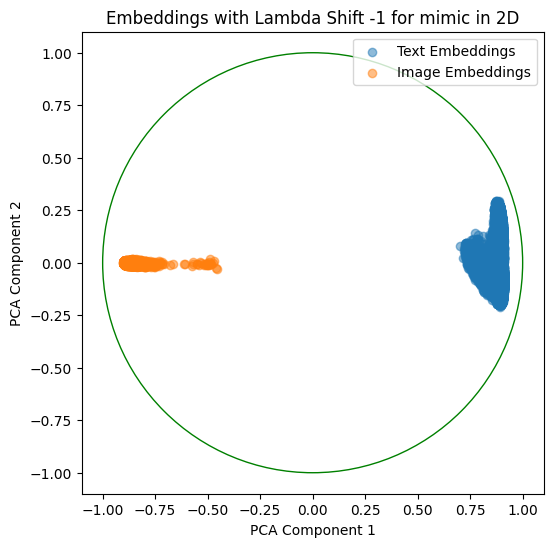

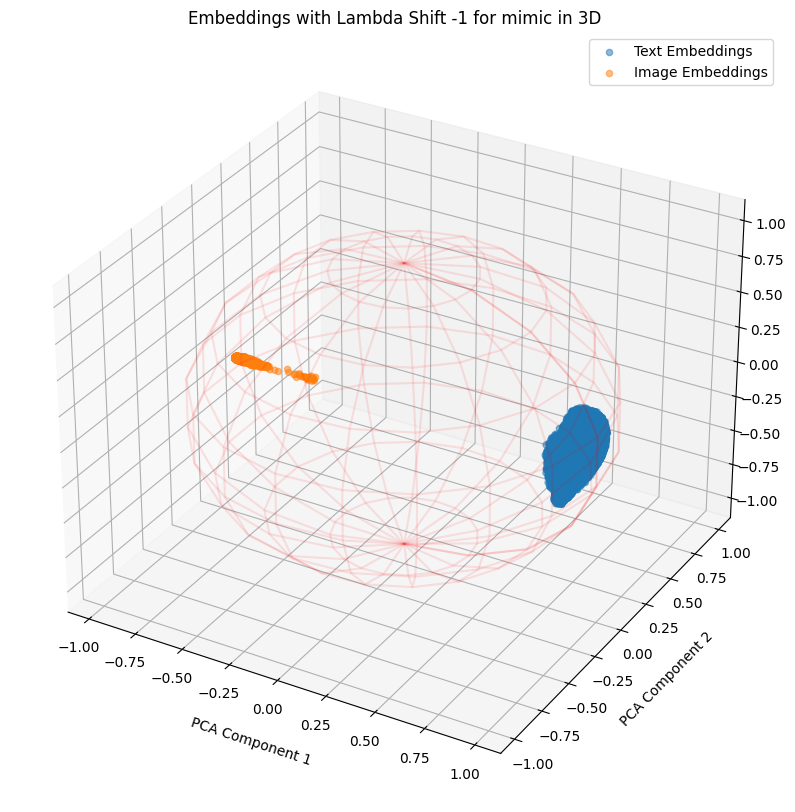

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 19.23 seconds
Total Training Time per Epoch: 961.43 seconds
Average Inference Time per Epoch: 2.64 seconds
Total Inference Time per Epoch: 132.10 seconds


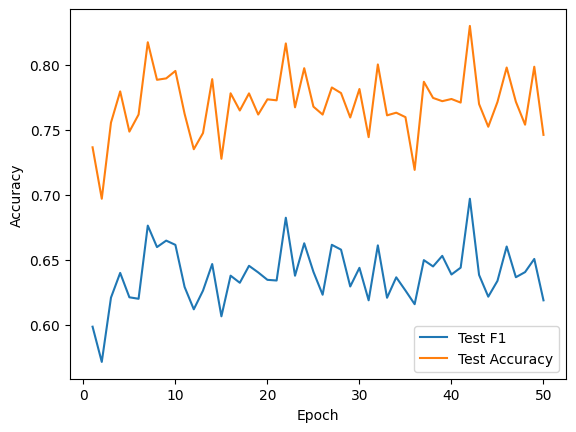

Best Accuracy: {'Acc': 0.8296772068511199, 'F1': 0.6967652396429378, 'Auc': 0.8374112369386467, 'Epoch': 42, 'Auc_Per_Class': array([0.93453828, 0.78184126, 0.78859733, 0.84466808])}
Best Macro-F1: {'Acc': 0.8296772068511199, 'F1': 0.6967652396429378, 'Auc': 0.8374112369386467, 'Epoch': 42, 'Auc_Per_Class': array([0.93453828, 0.78184126, 0.78859733, 0.84466808])}
Best Macro-AUC: {'Acc': 0.7592555994729908, 'F1': 0.6292931635782446, 'Auc': 0.8588814152375864, 'Epoch': 29, 'Auc_Per_Class': array([0.93230991, 0.8715102 , 0.82938416, 0.80232138])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.16 seconds
Total Training Time per Epoch: 908.06 seconds
Average Inference Time per Epoch: 2.88 seconds
Total Inference Time per Epoch: 143.77 seconds


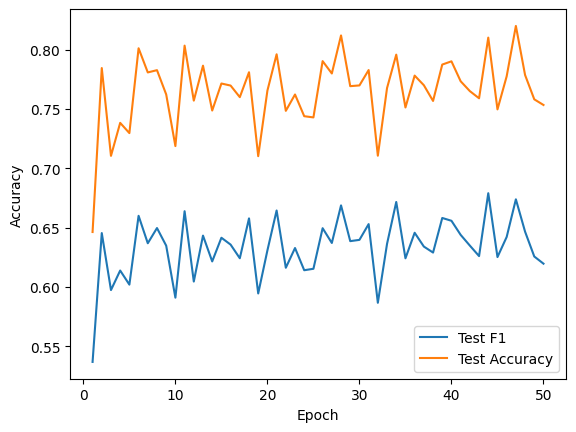

Best Accuracy: {'Acc': 0.8199275362318841, 'F1': 0.6739156086411493, 'Auc': 0.8407720208237295, 'Epoch': 47, 'Auc_Per_Class': array([0.9317096 , 0.83052643, 0.75939181, 0.84146023])}
Best Macro-F1: {'Acc': 0.8100790513833992, 'F1': 0.6790586072534486, 'Auc': 0.8169297873538375, 'Epoch': 44, 'Auc_Per_Class': array([0.91743958, 0.76704859, 0.75025959, 0.83297139])}
Best Macro-AUC: {'Acc': 0.7873847167325428, 'F1': 0.6582093611921545, 'Auc': 0.8582808808124425, 'Epoch': 39, 'Auc_Per_Class': array([0.93451751, 0.85310182, 0.82362026, 0.82188394])}
##################################################  Shift -0.9  ##################################################


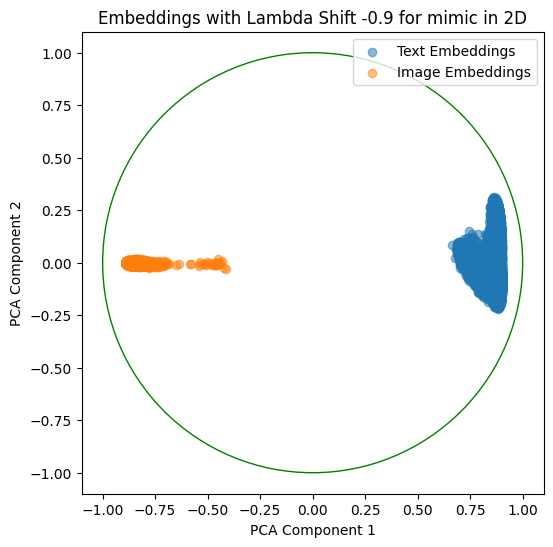

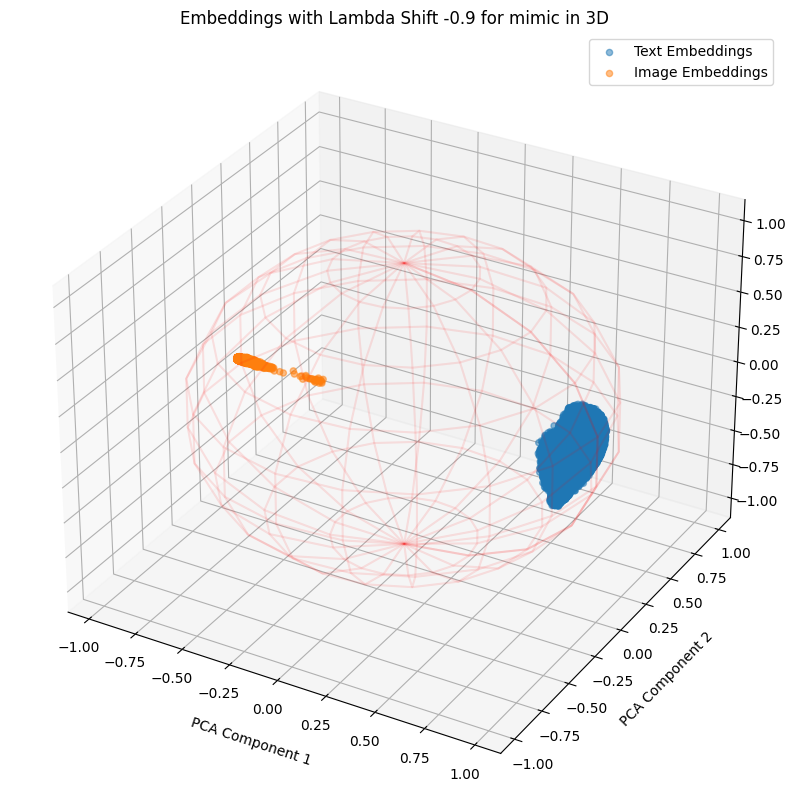

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 36.54 seconds
Total Training Time per Epoch: 1827.05 seconds
Average Inference Time per Epoch: 5.81 seconds
Total Inference Time per Epoch: 290.31 seconds


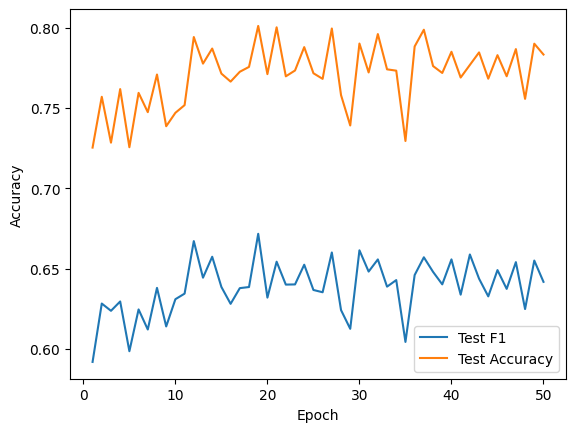

Best Accuracy: {'Acc': 0.8011857707509882, 'F1': 0.6716923636712244, 'Auc': 0.8512208012889737, 'Epoch': 19, 'Auc_Per_Class': array([0.93118486, 0.82367362, 0.82196245, 0.82806227])}
Best Macro-F1: {'Acc': 0.8011857707509882, 'F1': 0.6716923636712244, 'Auc': 0.8512208012889737, 'Epoch': 19, 'Auc_Per_Class': array([0.93118486, 0.82367362, 0.82196245, 0.82806227])}
Best Macro-AUC: {'Acc': 0.7711462450592885, 'F1': 0.6319412371100295, 'Auc': 0.8578294840923506, 'Epoch': 20, 'Auc_Per_Class': array([0.93123377, 0.88902861, 0.79850975, 0.8125458 ])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 42.42 seconds
Total Training Time per Epoch: 2121.10 seconds
Average Inference Time per Epoch: 8.35 seconds
Total Inference Time per Epoch: 417.72 seconds


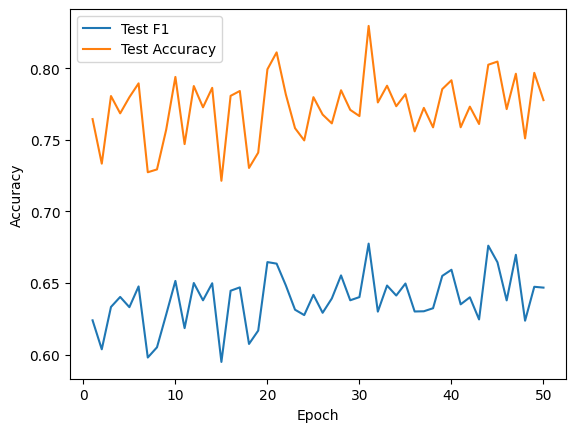

Best Accuracy: {'Acc': 0.8295125164690382, 'F1': 0.6774427898892244, 'Auc': 0.8303447057863944, 'Epoch': 31, 'Auc_Per_Class': array([0.93335985, 0.81264463, 0.73015351, 0.84522083])}
Best Macro-F1: {'Acc': 0.8295125164690382, 'F1': 0.6774427898892244, 'Auc': 0.8303447057863944, 'Epoch': 31, 'Auc_Per_Class': array([0.93335985, 0.81264463, 0.73015351, 0.84522083])}
Best Macro-AUC: {'Acc': 0.7875164690382082, 'F1': 0.6499385991654005, 'Auc': 0.859827536996297, 'Epoch': 12, 'Auc_Per_Class': array([0.93338441, 0.87750324, 0.80669554, 0.82172696])}
##################################################  Shift -0.8  ##################################################


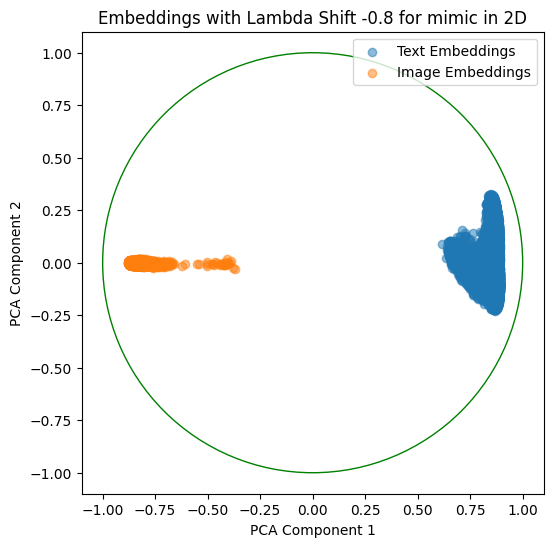

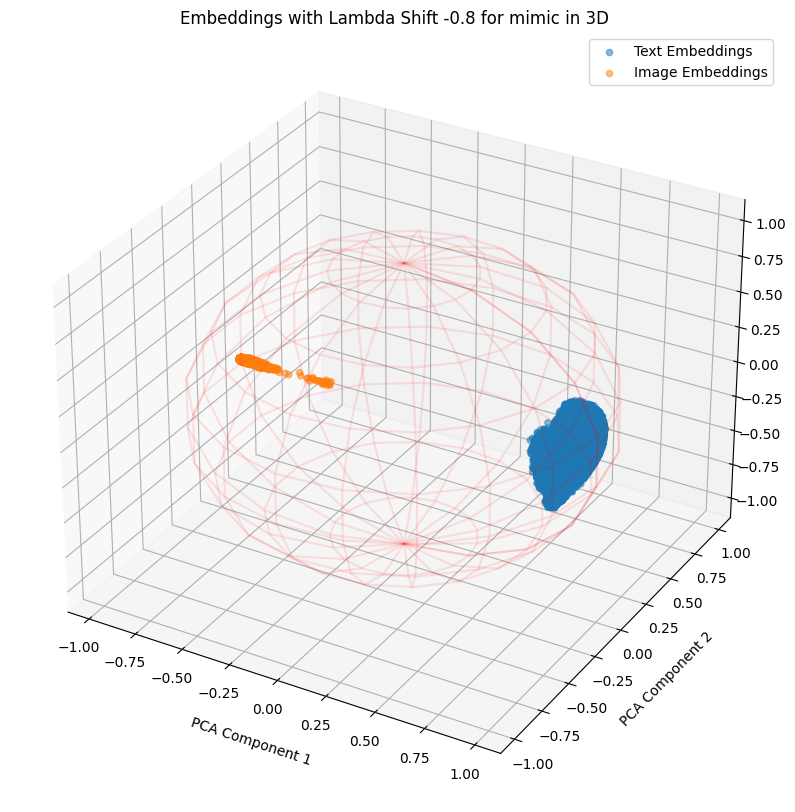

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.51 seconds
Total Training Time per Epoch: 1125.67 seconds
Average Inference Time per Epoch: 3.65 seconds
Total Inference Time per Epoch: 182.72 seconds


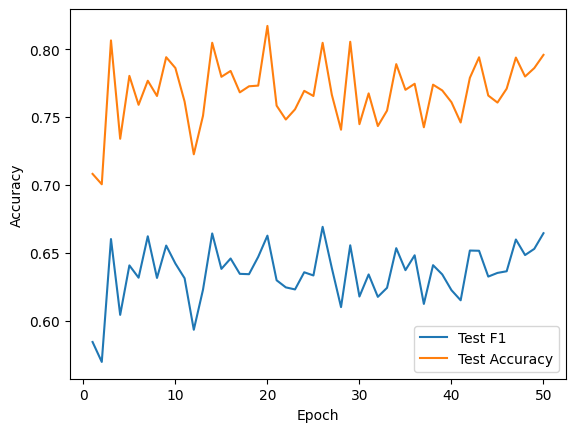

Best Accuracy: {'Acc': 0.8171277997364954, 'F1': 0.6627401718240982, 'Auc': 0.8414006668455947, 'Epoch': 20, 'Auc_Per_Class': array([0.93097365, 0.84426684, 0.75095857, 0.8394036 ])}
Best Macro-F1: {'Acc': 0.8047101449275362, 'F1': 0.6692471481908635, 'Auc': 0.855871661011769, 'Epoch': 26, 'Auc_Per_Class': array([0.93372297, 0.85114169, 0.8060946 , 0.83252739])}
Best Macro-AUC: {'Acc': 0.7674571805006588, 'F1': 0.6341930237209021, 'Auc': 0.8566899971579457, 'Epoch': 31, 'Auc_Per_Class': array([0.93396347, 0.86885046, 0.81707074, 0.80687531])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 19.35 seconds
Total Training Time per Epoch: 967.63 seconds
Average Inference Time per Epoch: 3.72 seconds
Total Inference Time per Epoch: 185.78 seconds


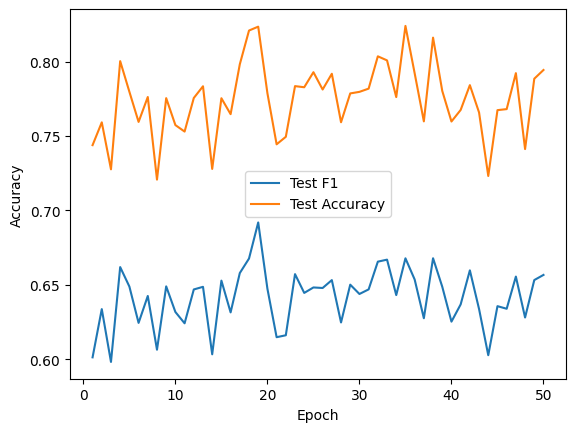

Best Accuracy: {'Acc': 0.8239459815546772, 'F1': 0.6678027875692101, 'Auc': 0.8382706755504299, 'Epoch': 35, 'Auc_Per_Class': array([0.93379267, 0.84597621, 0.73045235, 0.84286147])}
Best Macro-F1: {'Acc': 0.8234519104084321, 'F1': 0.6919021519221079, 'Auc': 0.8355822572081704, 'Epoch': 19, 'Auc_Per_Class': array([0.93123969, 0.77141413, 0.79747866, 0.84219655])}
Best Macro-AUC: {'Acc': 0.7796442687747036, 'F1': 0.6438373897447857, 'Auc': 0.8585628577240689, 'Epoch': 30, 'Auc_Per_Class': array([0.9357061 , 0.86799169, 0.81427239, 0.81628125])}
##################################################  Shift -0.7  ##################################################


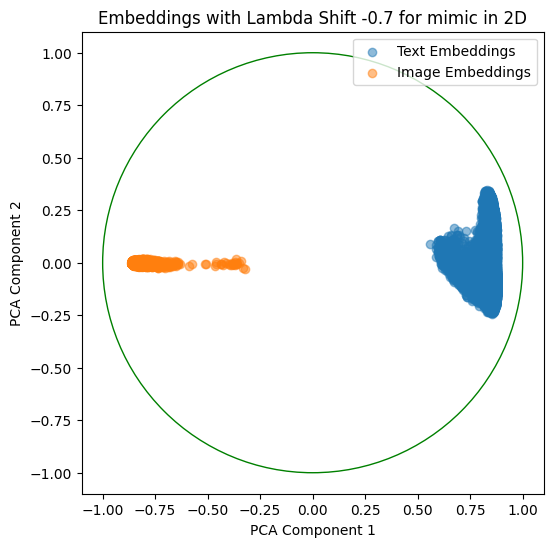

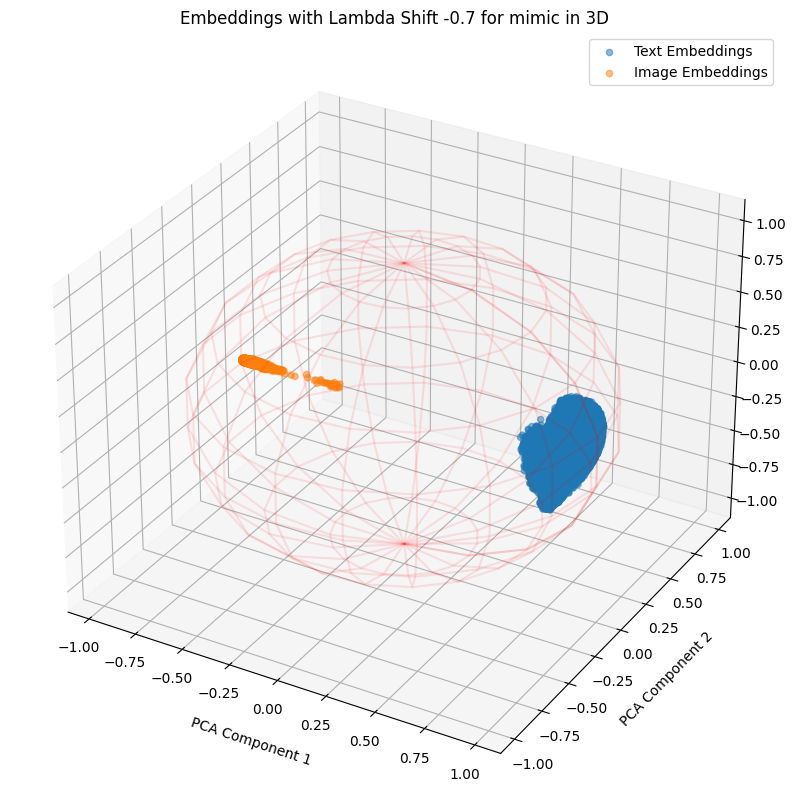

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.13 seconds
Total Training Time per Epoch: 1056.41 seconds
Average Inference Time per Epoch: 3.01 seconds
Total Inference Time per Epoch: 150.56 seconds


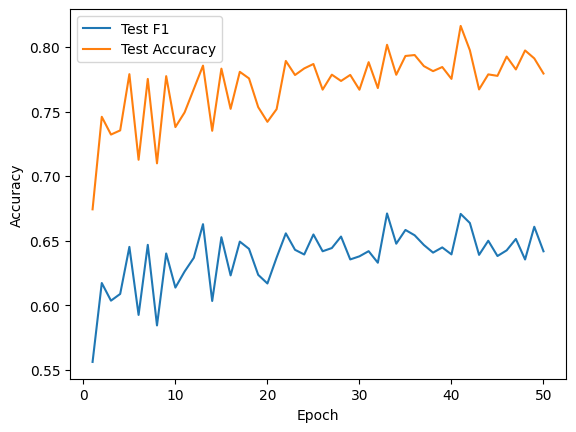

Best Accuracy: {'Acc': 0.8163702239789197, 'F1': 0.6707002927573735, 'Auc': 0.8327731876304052, 'Epoch': 41, 'Auc_Per_Class': array([0.92765312, 0.81501726, 0.74893749, 0.83948488])}
Best Macro-F1: {'Acc': 0.8017457180500659, 'F1': 0.6710410283854519, 'Auc': 0.8509081435701323, 'Epoch': 33, 'Auc_Per_Class': array([0.93196452, 0.82887388, 0.81280674, 0.82998743])}
Best Macro-AUC: {'Acc': 0.7892292490118578, 'F1': 0.6556260431779708, 'Auc': 0.8572288892118965, 'Epoch': 22, 'Auc_Per_Class': array([0.93342386, 0.85032844, 0.82365435, 0.82150891])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.45 seconds
Total Training Time per Epoch: 922.36 seconds
Average Inference Time per Epoch: 3.03 seconds
Total Inference Time per Epoch: 151.43 seconds


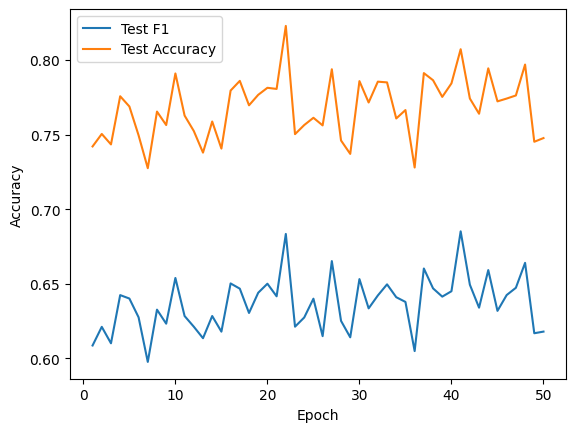

Best Accuracy: {'Acc': 0.8227931488801054, 'F1': 0.6833727229464758, 'Auc': 0.8463422239287007, 'Epoch': 22, 'Auc_Per_Class': array([0.93504623, 0.81563858, 0.79359636, 0.84108772])}
Best Macro-F1: {'Acc': 0.8071805006587616, 'F1': 0.6851217143533967, 'Auc': 0.8412106324023068, 'Epoch': 41, 'Auc_Per_Class': array([0.93510483, 0.77180257, 0.82476733, 0.83316779])}
Best Macro-AUC: {'Acc': 0.780566534914361, 'F1': 0.641580028938005, 'Auc': 0.8577918411957691, 'Epoch': 21, 'Auc_Per_Class': array([0.9331687 , 0.87461879, 0.80687824, 0.81650163])}
##################################################  Shift -0.6  ##################################################


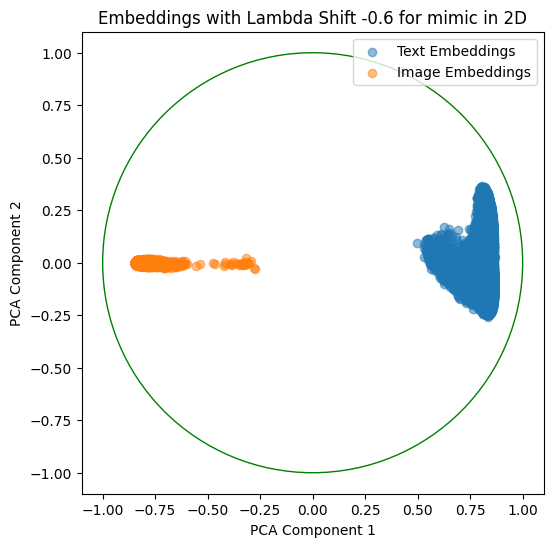

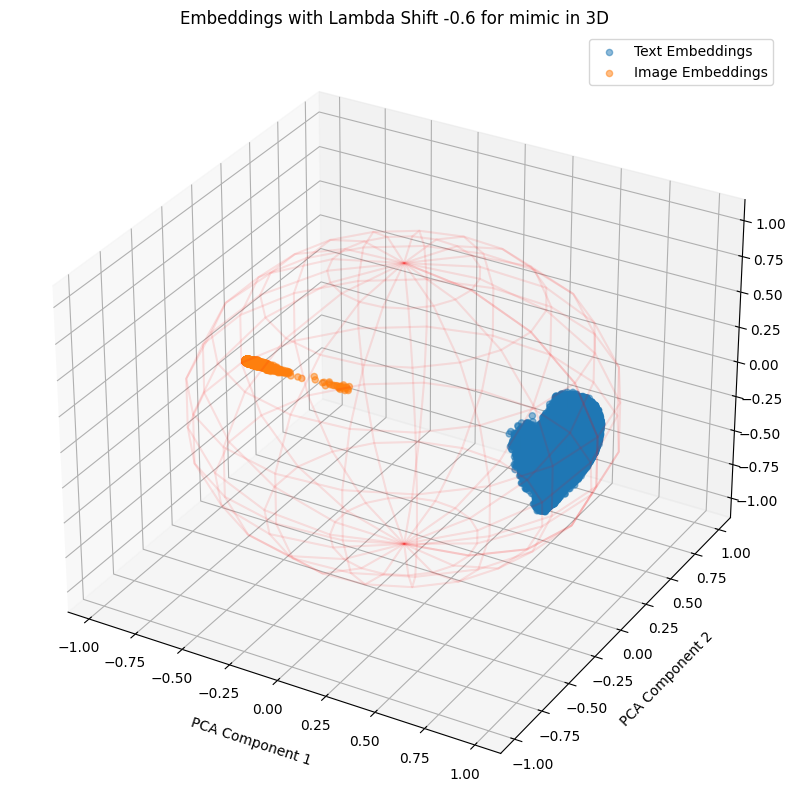

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.93 seconds
Total Training Time per Epoch: 1096.57 seconds
Average Inference Time per Epoch: 3.68 seconds
Total Inference Time per Epoch: 184.00 seconds


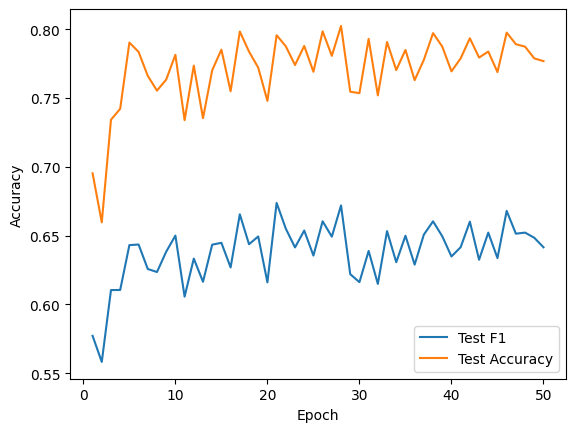

Best Accuracy: {'Acc': 0.80233860342556, 'F1': 0.6719457774717996, 'Auc': 0.8519744237010827, 'Epoch': 28, 'Auc_Per_Class': array([0.93333125, 0.82914411, 0.81586903, 0.82955331])}
Best Macro-F1: {'Acc': 0.7955862977602108, 'F1': 0.6737450049436255, 'Auc': 0.846834137559897, 'Epoch': 21, 'Auc_Per_Class': array([0.93227664, 0.81331304, 0.81639673, 0.82535015])}
Best Macro-AUC: {'Acc': 0.7933794466403162, 'F1': 0.6601268604267334, 'Auc': 0.8589454537652711, 'Epoch': 42, 'Auc_Per_Class': array([0.93280794, 0.86199206, 0.81597571, 0.82500611])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.95 seconds
Total Training Time per Epoch: 947.38 seconds
Average Inference Time per Epoch: 3.56 seconds
Total Inference Time per Epoch: 178.24 seconds


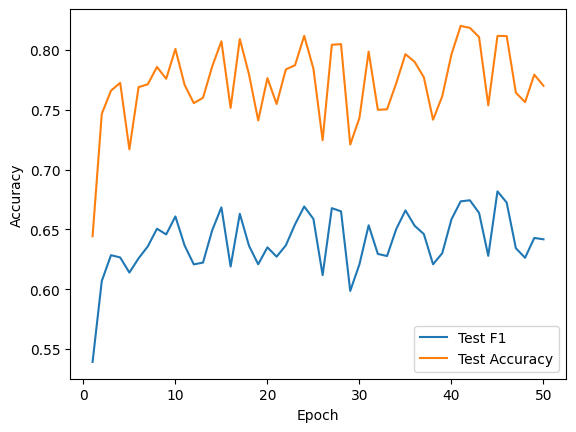

Best Accuracy: {'Acc': 0.8200592885375494, 'F1': 0.6733931199147665, 'Auc': 0.8396170610728786, 'Epoch': 41, 'Auc_Per_Class': array([0.92848283, 0.83970378, 0.74997935, 0.84030228])}
Best Macro-F1: {'Acc': 0.8116930171277997, 'F1': 0.6817359324072436, 'Auc': 0.8276039331573452, 'Epoch': 45, 'Auc_Per_Class': array([0.92697666, 0.71807474, 0.83082584, 0.83453849])}
Best Macro-AUC: {'Acc': 0.7699934123847167, 'F1': 0.6416682578024115, 'Auc': 0.8574352439484589, 'Epoch': 50, 'Auc_Per_Class': array([0.93420941, 0.85416069, 0.83287889, 0.80849199])}
##################################################  Shift -0.5  ##################################################


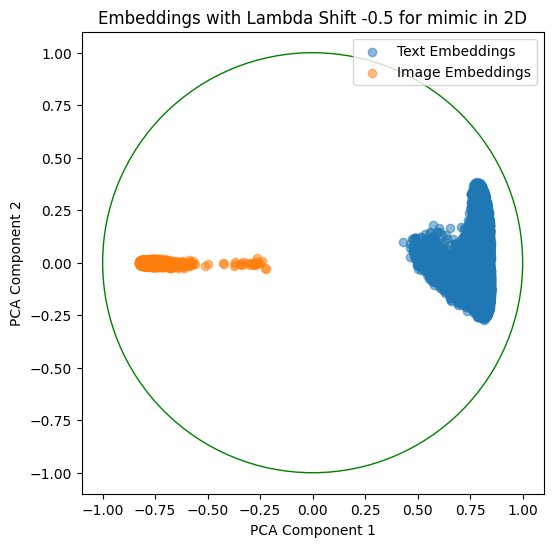

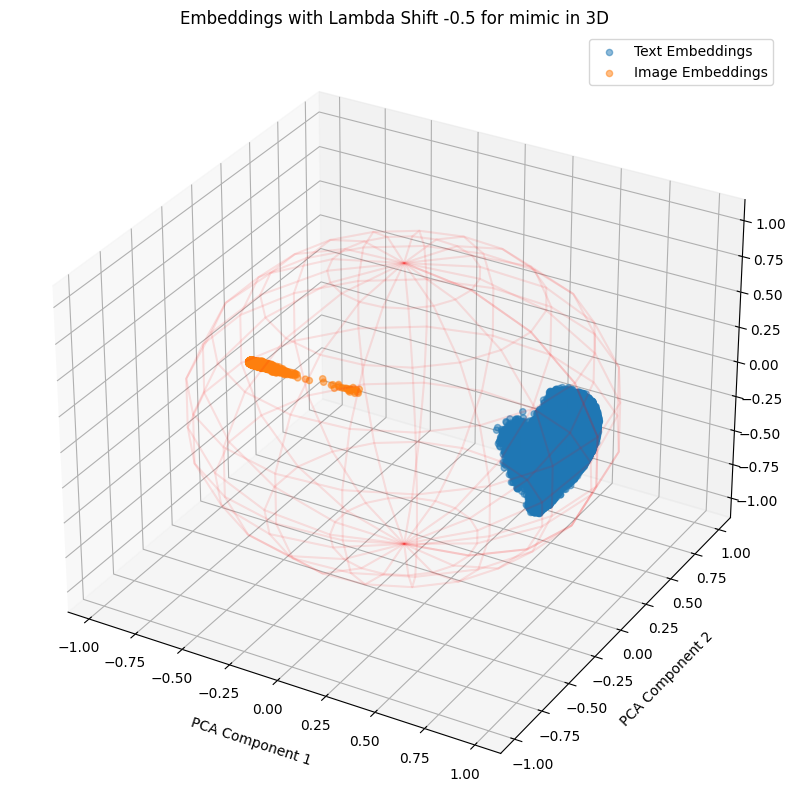

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 23.73 seconds
Total Training Time per Epoch: 1186.26 seconds
Average Inference Time per Epoch: 3.70 seconds
Total Inference Time per Epoch: 184.87 seconds


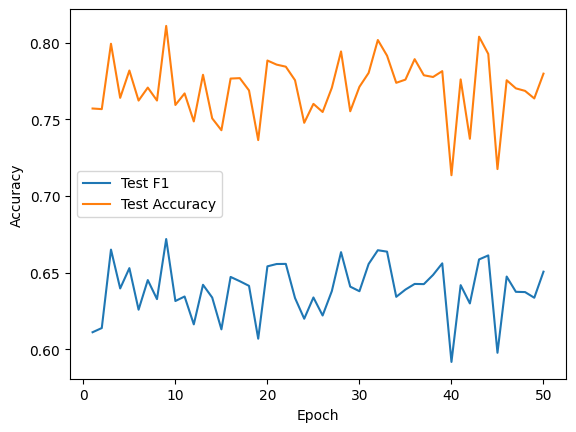

Best Accuracy: {'Acc': 0.8108366271409749, 'F1': 0.6718581794003395, 'Auc': 0.8422472385659017, 'Epoch': 9, 'Auc_Per_Class': array([0.93363935, 0.82107528, 0.77830074, 0.83597358])}
Best Macro-F1: {'Acc': 0.8108366271409749, 'F1': 0.6718581794003395, 'Auc': 0.8422472385659017, 'Epoch': 9, 'Auc_Per_Class': array([0.93363935, 0.82107528, 0.77830074, 0.83597358])}
Best Macro-AUC: {'Acc': 0.7786561264822134, 'F1': 0.6424701100300325, 'Auc': 0.8594520833667154, 'Epoch': 37, 'Auc_Per_Class': array([0.93208357, 0.87632817, 0.8150924 , 0.81430419])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 19.51 seconds
Total Training Time per Epoch: 975.60 seconds
Average Inference Time per Epoch: 3.69 seconds
Total Inference Time per Epoch: 184.42 seconds


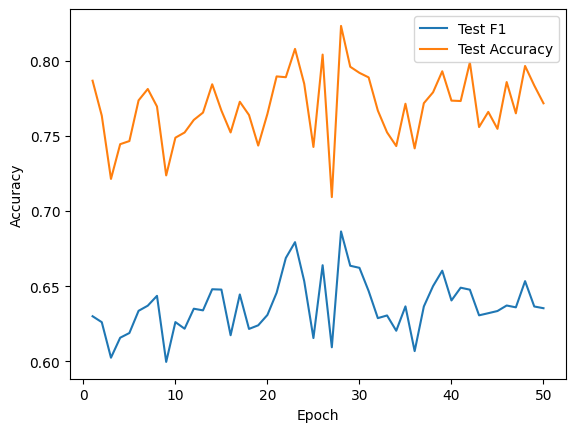

Best Accuracy: {'Acc': 0.8231554677206852, 'F1': 0.6864162339784097, 'Auc': 0.8368733653358166, 'Epoch': 28, 'Auc_Per_Class': array([0.92926976, 0.77336095, 0.80682571, 0.83803704])}
Best Macro-F1: {'Acc': 0.8231554677206852, 'F1': 0.6864162339784097, 'Auc': 0.8368733653358166, 'Epoch': 28, 'Auc_Per_Class': array([0.92926976, 0.77336095, 0.80682571, 0.83803704])}
Best Macro-AUC: {'Acc': 0.7717391304347826, 'F1': 0.636485428715625, 'Auc': 0.8572647813385417, 'Epoch': 37, 'Auc_Per_Class': array([0.93262886, 0.87356452, 0.81375105, 0.8091147 ])}
##################################################  Shift -0.4  ##################################################


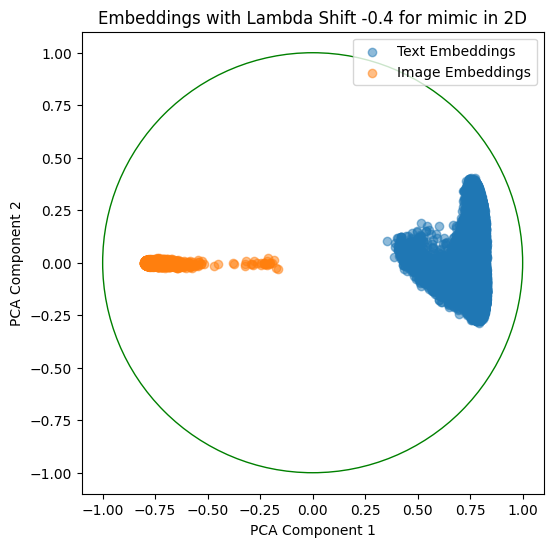

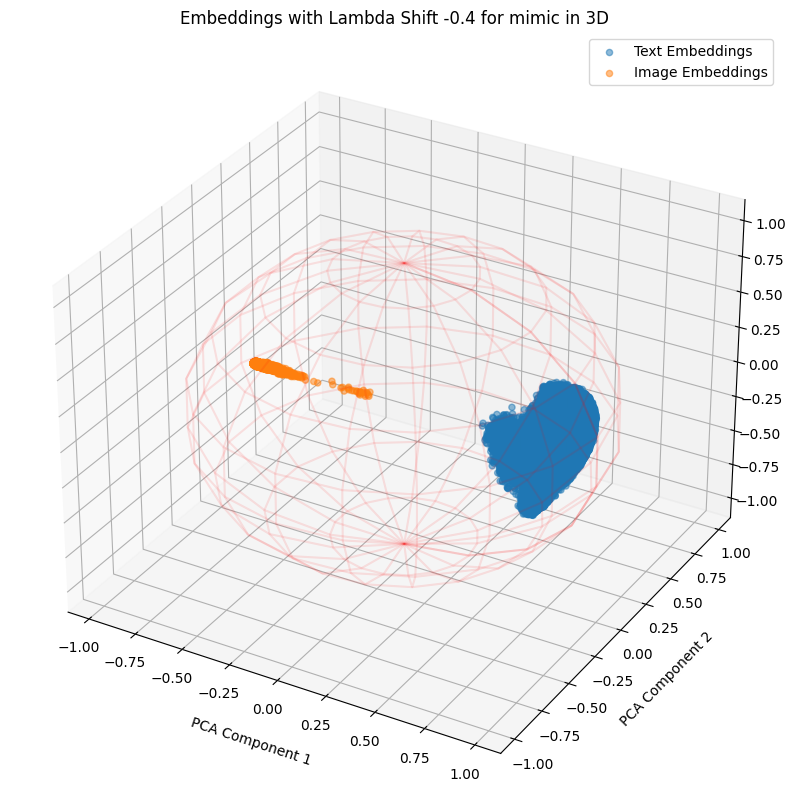

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.74 seconds
Total Training Time per Epoch: 1087.18 seconds
Average Inference Time per Epoch: 3.78 seconds
Total Inference Time per Epoch: 189.13 seconds


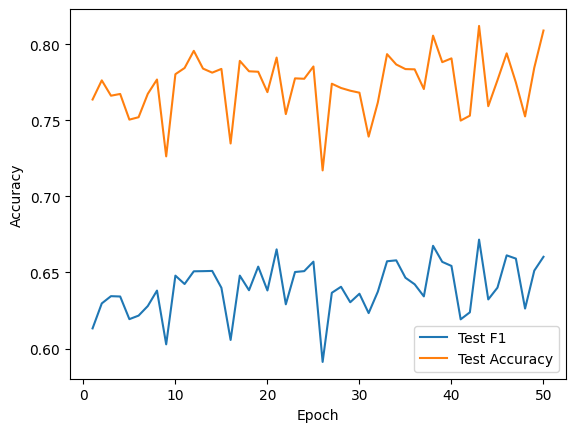

Best Accuracy: {'Acc': 0.8119894598155468, 'F1': 0.6715819664807983, 'Auc': 0.8488321403788854, 'Epoch': 43, 'Auc_Per_Class': array([0.93414234, 0.84208614, 0.78217897, 0.83692112])}
Best Macro-F1: {'Acc': 0.8119894598155468, 'F1': 0.6715819664807983, 'Auc': 0.8488321403788854, 'Epoch': 43, 'Auc_Per_Class': array([0.93414234, 0.84208614, 0.78217897, 0.83692112])}
Best Macro-AUC: {'Acc': 0.777536231884058, 'F1': 0.650314761224159, 'Auc': 0.8594858057726006, 'Epoch': 23, 'Auc_Per_Class': array([0.93292962, 0.85149736, 0.8384867 , 0.81502955])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.91 seconds
Total Training Time per Epoch: 945.41 seconds
Average Inference Time per Epoch: 3.68 seconds
Total Inference Time per Epoch: 184.05 seconds


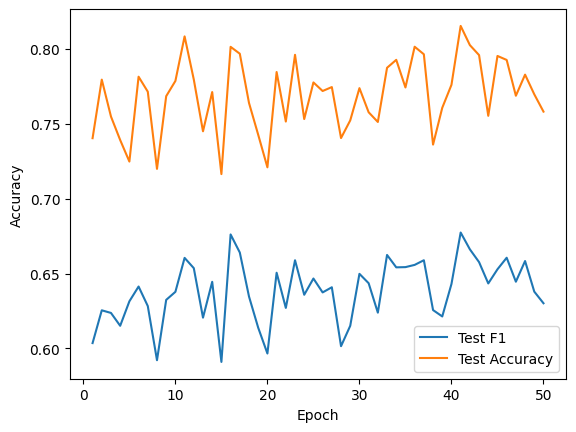

Best Accuracy: {'Acc': 0.8154808959156785, 'F1': 0.6774663319713355, 'Auc': 0.8523318885983713, 'Epoch': 41, 'Auc_Per_Class': array([0.9332566 , 0.8433866 , 0.79359489, 0.83908946])}
Best Macro-F1: {'Acc': 0.8154808959156785, 'F1': 0.6774663319713355, 'Auc': 0.8523318885983713, 'Epoch': 41, 'Auc_Per_Class': array([0.9332566 , 0.8433866 , 0.79359489, 0.83908946])}
Best Macro-AUC: {'Acc': 0.7761198945981554, 'F1': 0.6430836761700636, 'Auc': 0.8579934062205864, 'Epoch': 40, 'Auc_Per_Class': array([0.9311636 , 0.8622776 , 0.82449279, 0.81403962])}
##################################################  Shift -0.3  ##################################################


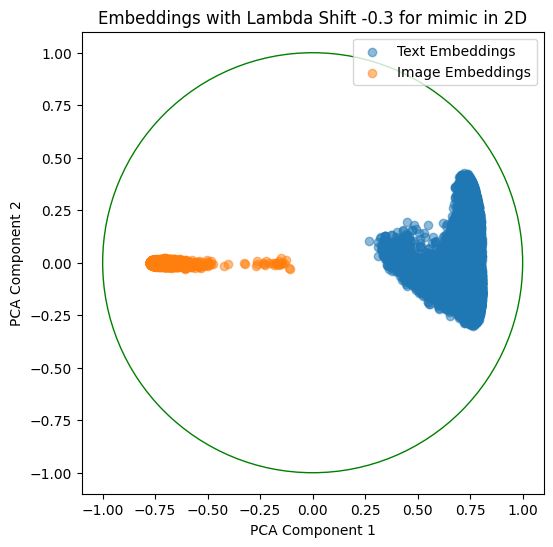

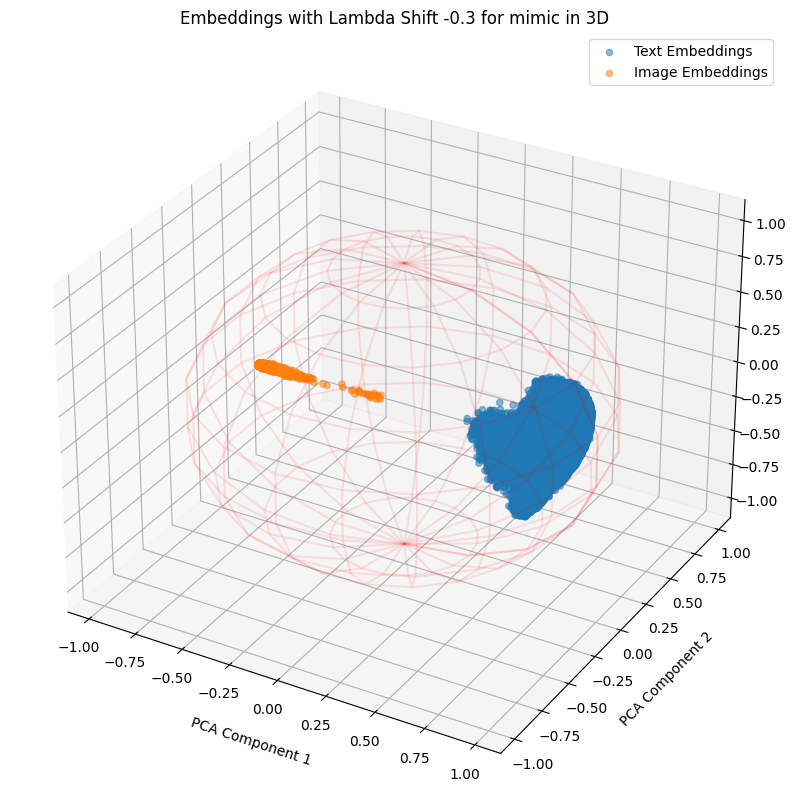

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.55 seconds
Total Training Time per Epoch: 1127.30 seconds
Average Inference Time per Epoch: 3.61 seconds
Total Inference Time per Epoch: 180.42 seconds


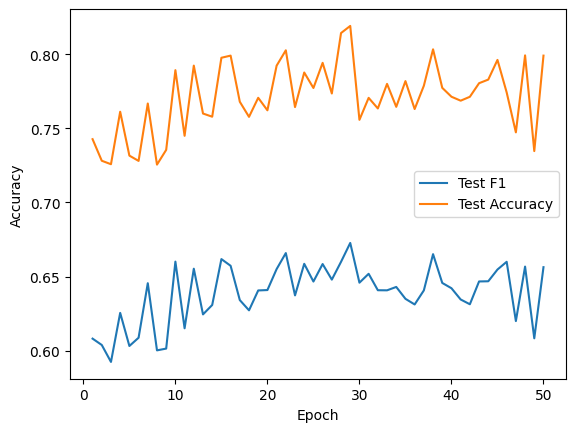

Best Accuracy: {'Acc': 0.8190382081686429, 'F1': 0.6726575096308862, 'Auc': 0.8451893828240828, 'Epoch': 29, 'Auc_Per_Class': array([0.93153333, 0.83421999, 0.77528674, 0.83971747])}
Best Macro-F1: {'Acc': 0.8190382081686429, 'F1': 0.6726575096308862, 'Auc': 0.8451893828240828, 'Epoch': 29, 'Auc_Per_Class': array([0.93153333, 0.83421999, 0.77528674, 0.83971747])}
Best Macro-AUC: {'Acc': 0.7922595520421607, 'F1': 0.655296172907724, 'Auc': 0.8571416613431833, 'Epoch': 12, 'Auc_Per_Class': array([0.93275384, 0.85847556, 0.81326332, 0.82407393])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 19.13 seconds
Total Training Time per Epoch: 956.40 seconds
Average Inference Time per Epoch: 3.68 seconds
Total Inference Time per Epoch: 183.88 seconds


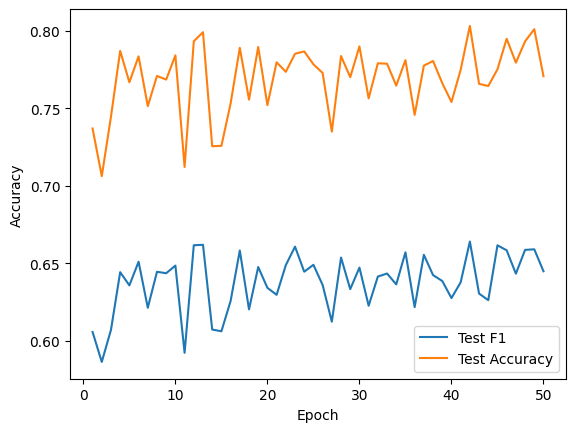

Best Accuracy: {'Acc': 0.8032938076416337, 'F1': 0.6639703417927156, 'Auc': 0.855616509991528, 'Epoch': 42, 'Auc_Per_Class': array([0.93486008, 0.85904621, 0.79708048, 0.83147927])}
Best Macro-F1: {'Acc': 0.8032938076416337, 'F1': 0.6639703417927156, 'Auc': 0.855616509991528, 'Epoch': 42, 'Auc_Per_Class': array([0.93486008, 0.85904621, 0.79708048, 0.83147927])}
Best Macro-AUC: {'Acc': 0.7541501976284585, 'F1': 0.6274709355786366, 'Auc': 0.8573746335129309, 'Epoch': 40, 'Auc_Per_Class': array([0.93025071, 0.86701213, 0.83309567, 0.79914002])}
##################################################  Shift -0.2  ##################################################


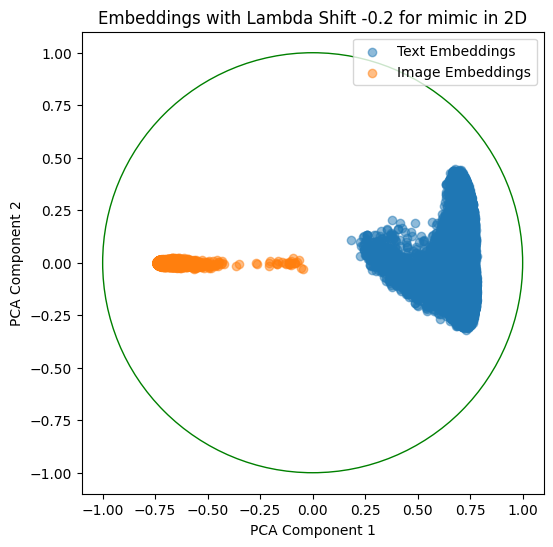

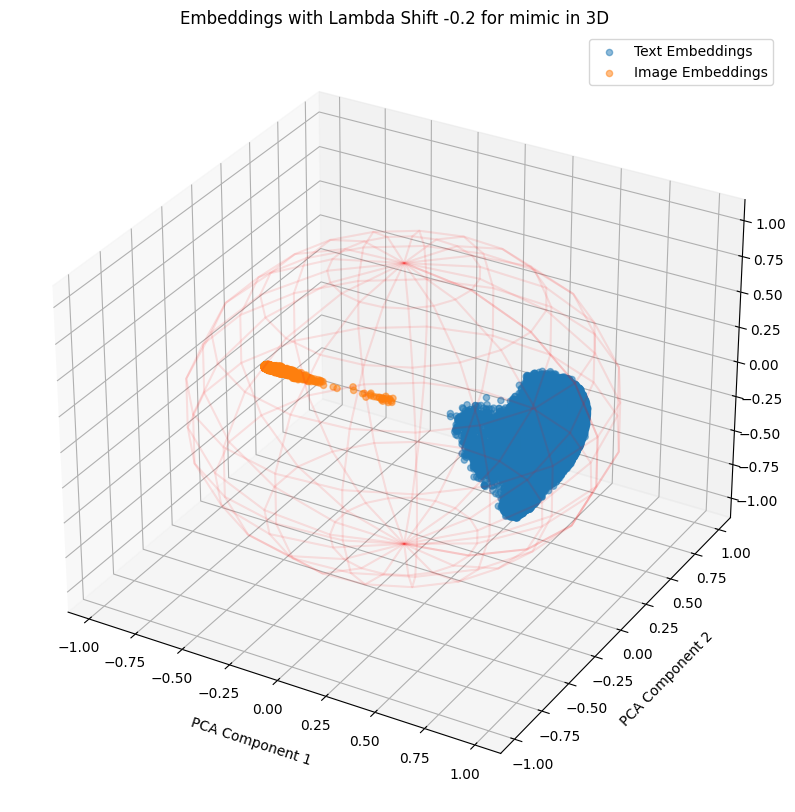

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.07 seconds
Total Training Time per Epoch: 1103.59 seconds
Average Inference Time per Epoch: 3.75 seconds
Total Inference Time per Epoch: 187.53 seconds


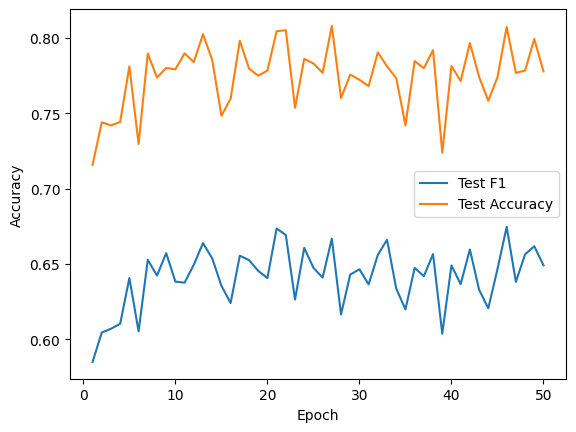

Best Accuracy: {'Acc': 0.807905138339921, 'F1': 0.6667208887930124, 'Auc': 0.8429154093807806, 'Epoch': 27, 'Auc_Per_Class': array([0.93260264, 0.82532976, 0.78076845, 0.83296079])}
Best Macro-F1: {'Acc': 0.8072134387351778, 'F1': 0.6746017718660117, 'Auc': 0.8469100469949772, 'Epoch': 46, 'Auc_Per_Class': array([0.93188442, 0.81320555, 0.81087293, 0.83167729])}
Best Macro-AUC: {'Acc': 0.781258234519104, 'F1': 0.6489491804808853, 'Auc': 0.8572301362618906, 'Epoch': 40, 'Auc_Per_Class': array([0.93256579, 0.86015473, 0.81953584, 0.81666418])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.57 seconds
Total Training Time per Epoch: 928.34 seconds
Average Inference Time per Epoch: 3.59 seconds
Total Inference Time per Epoch: 179.72 seconds


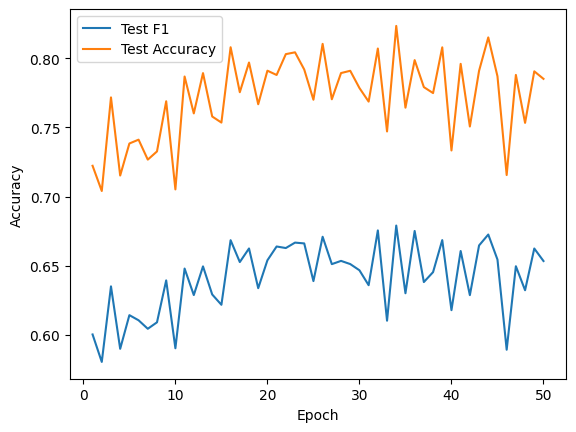

Best Accuracy: {'Acc': 0.8233530961791832, 'F1': 0.6791088676796684, 'Auc': 0.8449212043356966, 'Epoch': 34, 'Auc_Per_Class': array([0.93227778, 0.82276519, 0.78388865, 0.8407532 ])}
Best Macro-F1: {'Acc': 0.8233530961791832, 'F1': 0.6791088676796684, 'Auc': 0.8449212043356966, 'Epoch': 34, 'Auc_Per_Class': array([0.93227778, 0.82276519, 0.78388865, 0.8407532 ])}
Best Macro-AUC: {'Acc': 0.7667654808959157, 'F1': 0.633867183021715, 'Auc': 0.8581874548290124, 'Epoch': 19, 'Auc_Per_Class': array([0.93348884, 0.87162485, 0.82001085, 0.80762528])}
##################################################  Shift -0.1  ##################################################


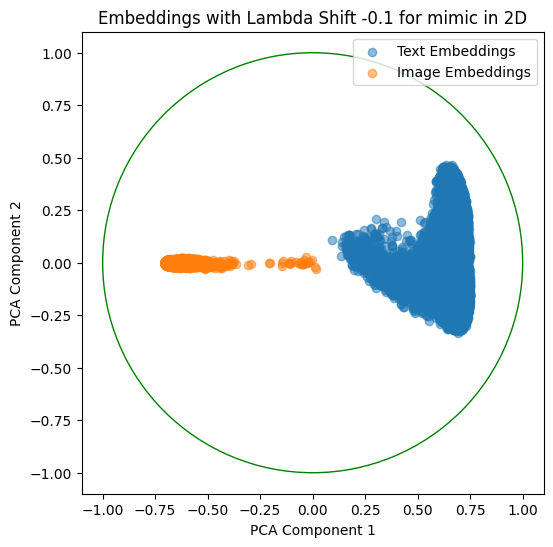

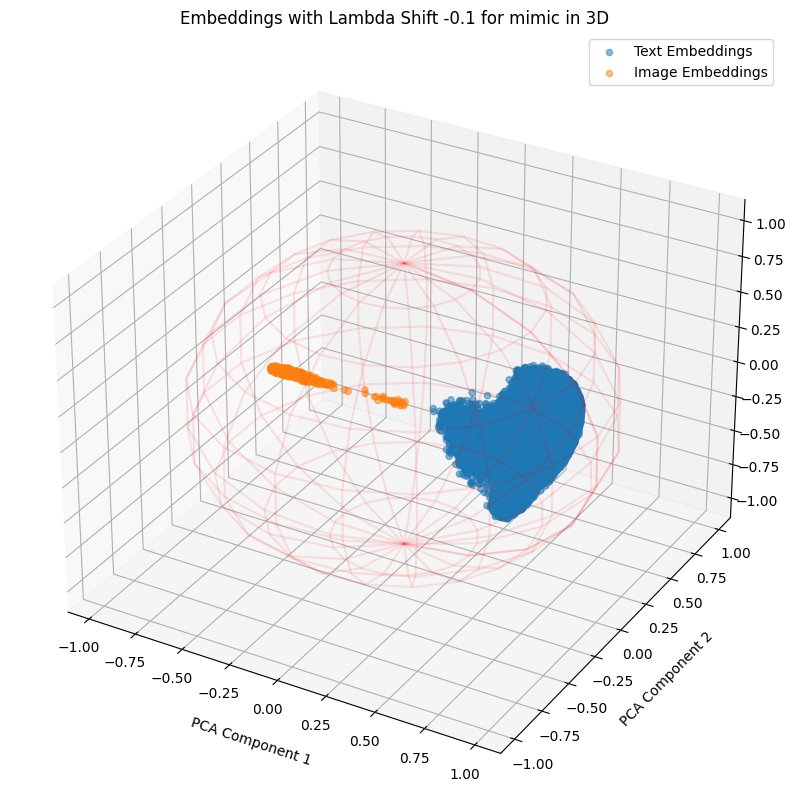

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.63 seconds
Total Training Time per Epoch: 1081.74 seconds
Average Inference Time per Epoch: 3.71 seconds
Total Inference Time per Epoch: 185.38 seconds


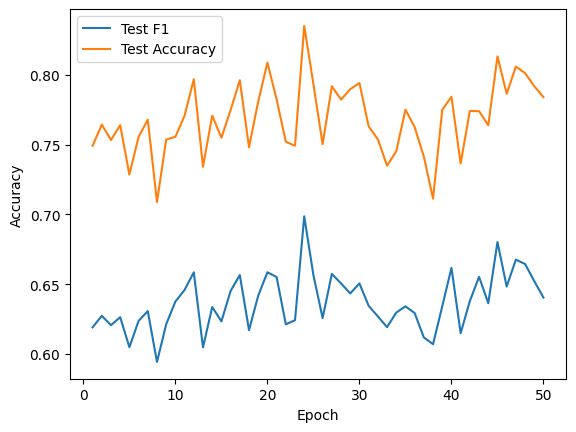

Best Accuracy: {'Acc': 0.8352437417654809, 'F1': 0.6986982054978347, 'Auc': 0.8223966877695943, 'Epoch': 24, 'Auc_Per_Class': array([0.91711935, 0.73852367, 0.79366389, 0.84027983])}
Best Macro-F1: {'Acc': 0.8352437417654809, 'F1': 0.6986982054978347, 'Auc': 0.8223966877695943, 'Epoch': 24, 'Auc_Per_Class': array([0.91711935, 0.73852367, 0.79366389, 0.84027983])}
Best Macro-AUC: {'Acc': 0.7919960474308301, 'F1': 0.6573576635588704, 'Auc': 0.8574269116504527, 'Epoch': 27, 'Auc_Per_Class': array([0.93295892, 0.85984357, 0.81296252, 0.82394263])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.47 seconds
Total Training Time per Epoch: 923.55 seconds
Average Inference Time per Epoch: 3.69 seconds
Total Inference Time per Epoch: 184.58 seconds


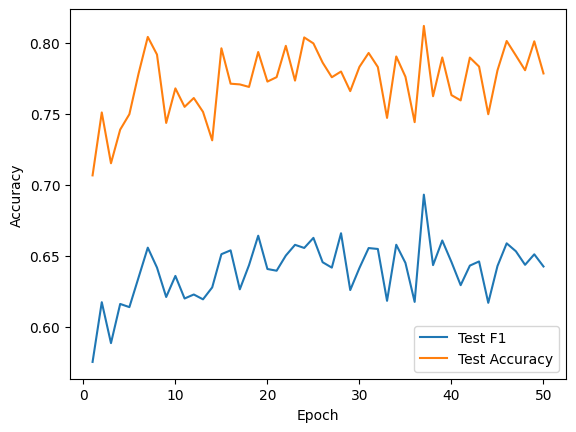

Best Accuracy: {'Acc': 0.8119565217391305, 'F1': 0.6931478060580127, 'Auc': 0.8462277907555595, 'Epoch': 37, 'Auc_Per_Class': array([0.93311696, 0.77986782, 0.83655387, 0.83537251])}
Best Macro-F1: {'Acc': 0.8119565217391305, 'F1': 0.6931478060580127, 'Auc': 0.8462277907555595, 'Epoch': 37, 'Auc_Per_Class': array([0.93311696, 0.77986782, 0.83655387, 0.83537251])}
Best Macro-AUC: {'Acc': 0.7595191040843214, 'F1': 0.6294102974053624, 'Auc': 0.8570376288627253, 'Epoch': 41, 'Auc_Per_Class': array([0.92711277, 0.87174665, 0.82599335, 0.80329774])}
##################################################  Shift 0  ##################################################


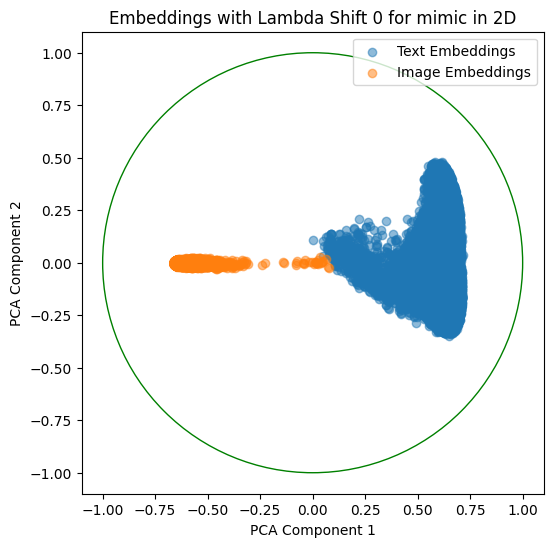

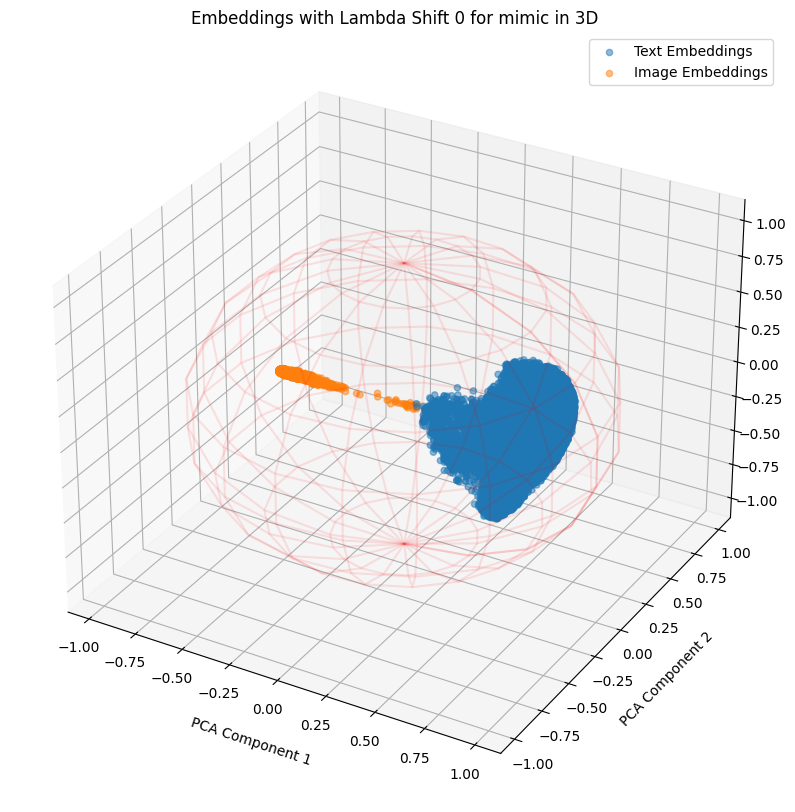

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.78 seconds
Total Training Time per Epoch: 1139.00 seconds
Average Inference Time per Epoch: 3.57 seconds
Total Inference Time per Epoch: 178.27 seconds


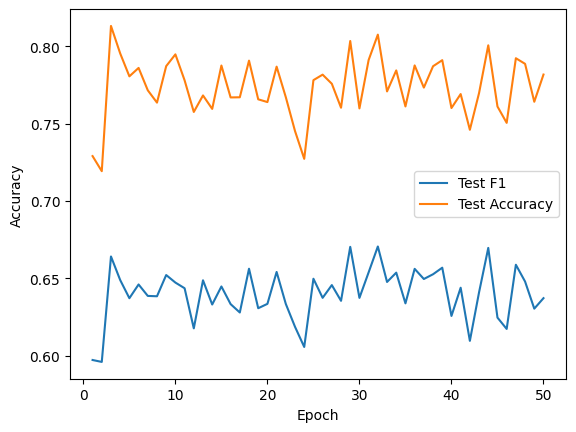

Best Accuracy: {'Acc': 0.8131093544137022, 'F1': 0.6641152212655249, 'Auc': 0.8382520333139551, 'Epoch': 3, 'Auc_Per_Class': array([0.92971866, 0.81788326, 0.76890736, 0.83649885])}
Best Macro-F1: {'Acc': 0.8074769433465085, 'F1': 0.6705657737946887, 'Auc': 0.8542441635007467, 'Epoch': 32, 'Auc_Per_Class': array([0.93013423, 0.84660726, 0.80751344, 0.83272173])}
Best Macro-AUC: {'Acc': 0.766897233201581, 'F1': 0.6333398182490356, 'Auc': 0.8577736457858194, 'Epoch': 16, 'Auc_Per_Class': array([0.93458127, 0.86506989, 0.82402757, 0.80741585])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.87 seconds
Total Training Time per Epoch: 943.38 seconds
Average Inference Time per Epoch: 3.71 seconds
Total Inference Time per Epoch: 185.50 seconds


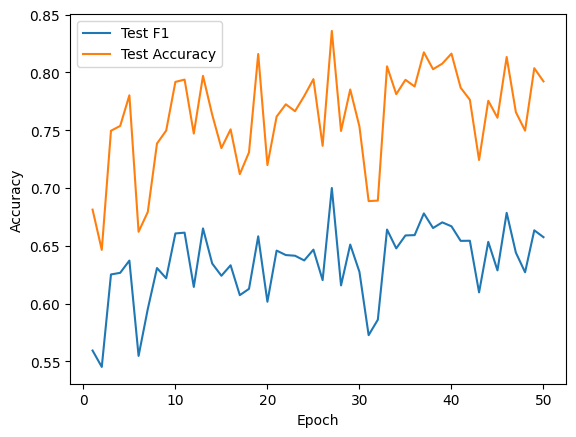

Best Accuracy: {'Acc': 0.835935441370224, 'F1': 0.6999953352463288, 'Auc': 0.8435465365149496, 'Epoch': 27, 'Auc_Per_Class': array([0.93676522, 0.78871096, 0.79777392, 0.85093604])}
Best Macro-F1: {'Acc': 0.835935441370224, 'F1': 0.6999953352463288, 'Auc': 0.8435465365149496, 'Epoch': 27, 'Auc_Per_Class': array([0.93676522, 0.78871096, 0.79777392, 0.85093604])}
Best Macro-AUC: {'Acc': 0.7664690382081687, 'F1': 0.6413910803174749, 'Auc': 0.8576651005390903, 'Epoch': 23, 'Auc_Per_Class': array([0.93030363, 0.85503534, 0.83673623, 0.80858521])}
##################################################  Shift 0.1  ##################################################


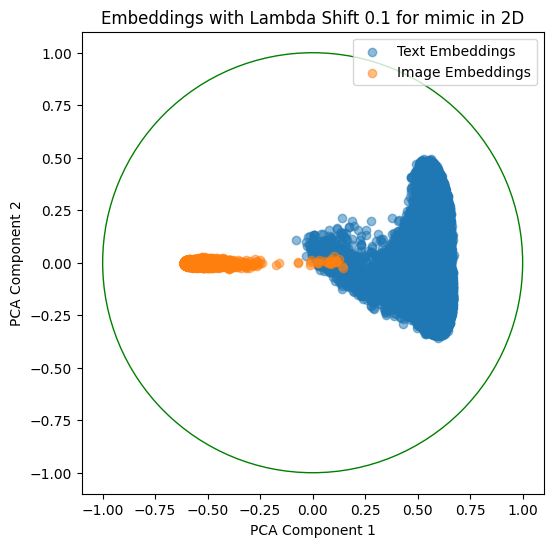

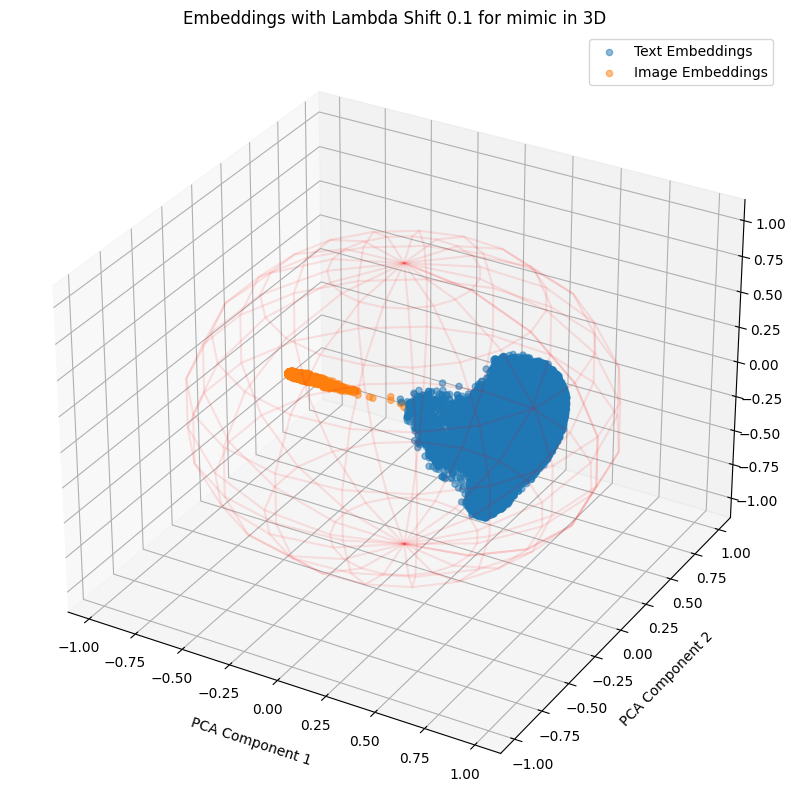

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.63 seconds
Total Training Time per Epoch: 1081.70 seconds
Average Inference Time per Epoch: 3.77 seconds
Total Inference Time per Epoch: 188.41 seconds


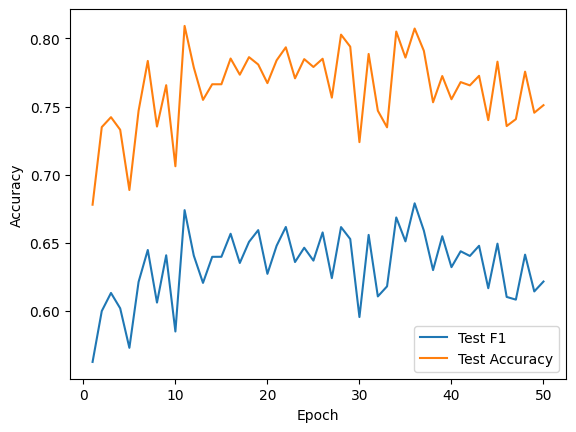

Best Accuracy: {'Acc': 0.8091567852437418, 'F1': 0.6740319248167347, 'Auc': 0.8500429119968306, 'Epoch': 11, 'Auc_Per_Class': array([0.92965581, 0.83230694, 0.80514653, 0.83306236])}
Best Macro-F1: {'Acc': 0.8072463768115942, 'F1': 0.6790432024122247, 'Auc': 0.8509051295671856, 'Epoch': 36, 'Auc_Per_Class': array([0.93408845, 0.81800662, 0.818041  , 0.83348445])}
Best Macro-AUC: {'Acc': 0.7679512516469038, 'F1': 0.6438719210429356, 'Auc': 0.8558916351783271, 'Epoch': 41, 'Auc_Per_Class': array([0.93347042, 0.8498617 , 0.83185334, 0.80838108])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.24 seconds
Total Training Time per Epoch: 912.03 seconds
Average Inference Time per Epoch: 3.71 seconds
Total Inference Time per Epoch: 185.66 seconds


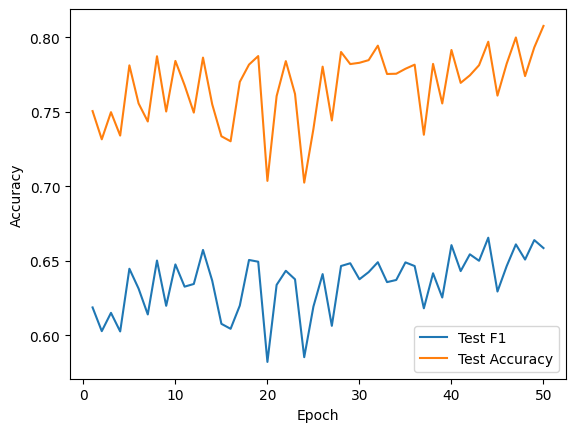

Best Accuracy: {'Acc': 0.8076416337285902, 'F1': 0.6585837475746283, 'Auc': 0.8455385052993912, 'Epoch': 50, 'Auc_Per_Class': array([0.92333265, 0.8568711 , 0.77228138, 0.82966889])}
Best Macro-F1: {'Acc': 0.7970355731225296, 'F1': 0.665536338964761, 'Auc': 0.8516763021069478, 'Epoch': 44, 'Auc_Per_Class': array([0.93413948, 0.83052643, 0.81495293, 0.82708636])}
Best Macro-AUC: {'Acc': 0.7816534914361001, 'F1': 0.6465160016783363, 'Auc': 0.8588117240432942, 'Epoch': 36, 'Auc_Per_Class': array([0.93384865, 0.86660936, 0.81713208, 0.8176568 ])}
##################################################  Shift 0.2  ##################################################


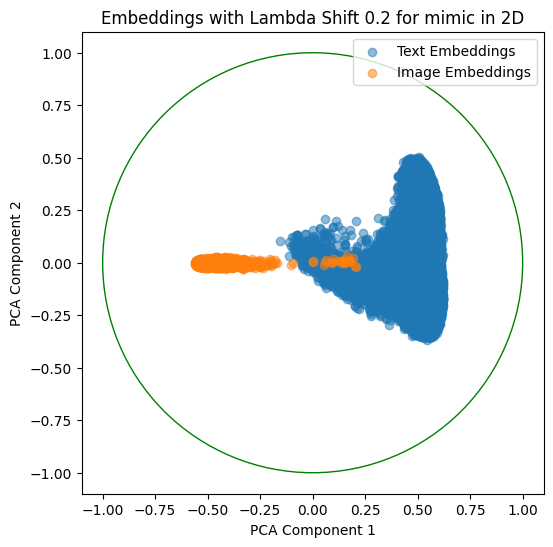

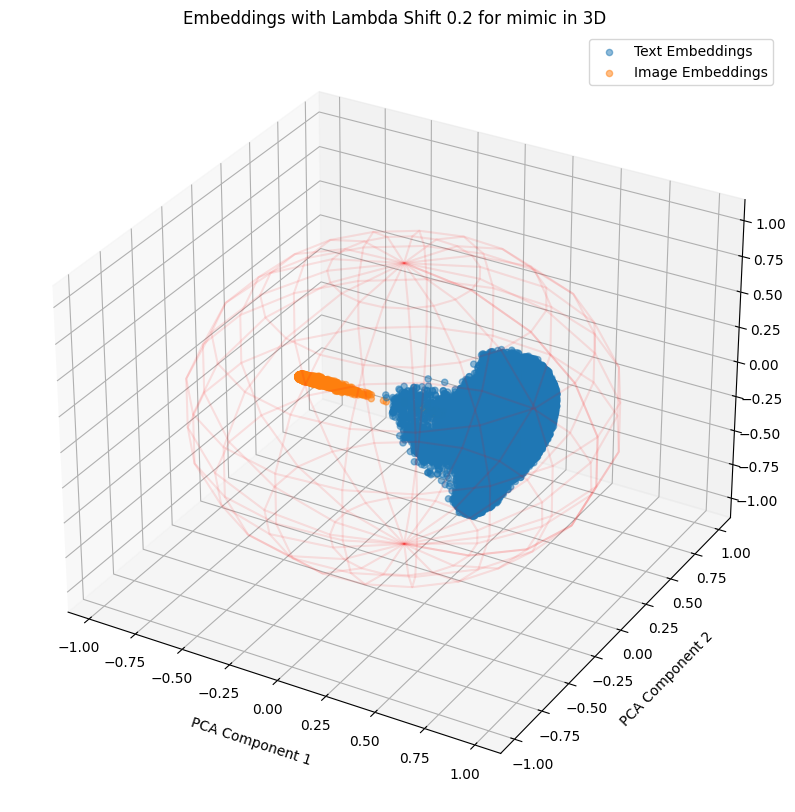

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.19 seconds
Total Training Time per Epoch: 1109.64 seconds
Average Inference Time per Epoch: 3.64 seconds
Total Inference Time per Epoch: 182.09 seconds


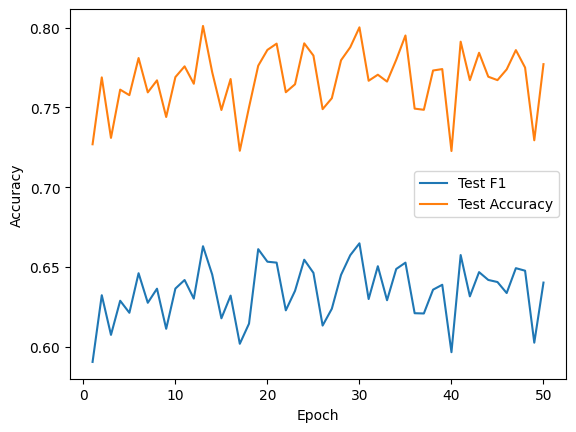

Best Accuracy: {'Acc': 0.8010210803689064, 'F1': 0.6630149530729486, 'Auc': 0.8474135495302577, 'Epoch': 13, 'Auc_Per_Class': array([0.92947204, 0.84472542, 0.78568152, 0.82977522])}
Best Macro-F1: {'Acc': 0.8001317523056654, 'F1': 0.6648302416667177, 'Auc': 0.8522718590433643, 'Epoch': 30, 'Auc_Per_Class': array([0.93082386, 0.83430801, 0.81587327, 0.8280823 ])}
Best Macro-AUC: {'Acc': 0.7730895915678524, 'F1': 0.6357904661378277, 'Auc': 0.8584424334511579, 'Epoch': 38, 'Auc_Per_Class': array([0.93294946, 0.87995517, 0.808684  , 0.8121811 ])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.43 seconds
Total Training Time per Epoch: 921.69 seconds
Average Inference Time per Epoch: 3.69 seconds
Total Inference Time per Epoch: 184.51 seconds


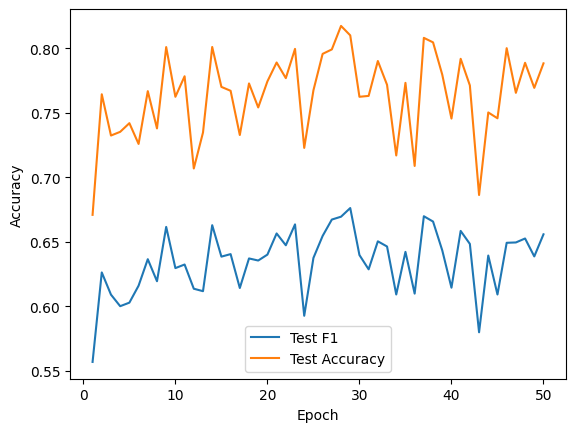

Best Accuracy: {'Acc': 0.8173913043478261, 'F1': 0.6694835582541239, 'Auc': 0.8499051167830667, 'Epoch': 28, 'Auc_Per_Class': array([0.93539021, 0.83896167, 0.78497178, 0.84029681])}
Best Macro-F1: {'Acc': 0.8100790513833992, 'F1': 0.6761911268780858, 'Auc': 0.8522664018773756, 'Epoch': 29, 'Auc_Per_Class': array([0.93711677, 0.81866272, 0.81657029, 0.83671582])}
Best Macro-AUC: {'Acc': 0.7624505928853755, 'F1': 0.6397656714407942, 'Auc': 0.8586550345801658, 'Epoch': 30, 'Auc_Per_Class': array([0.93453497, 0.85894129, 0.83709249, 0.80405139])}
##################################################  Shift 0.3  ##################################################


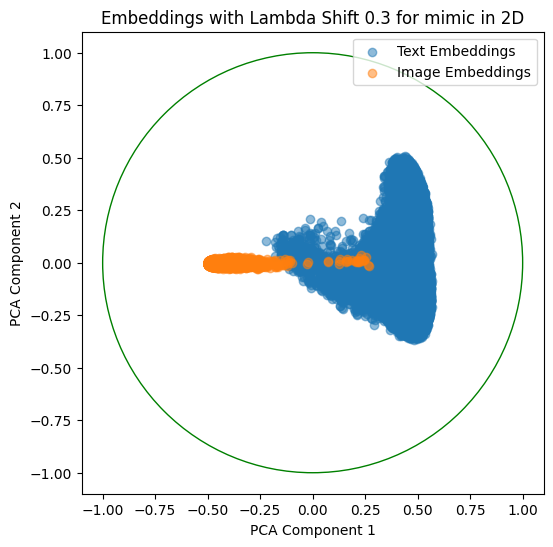

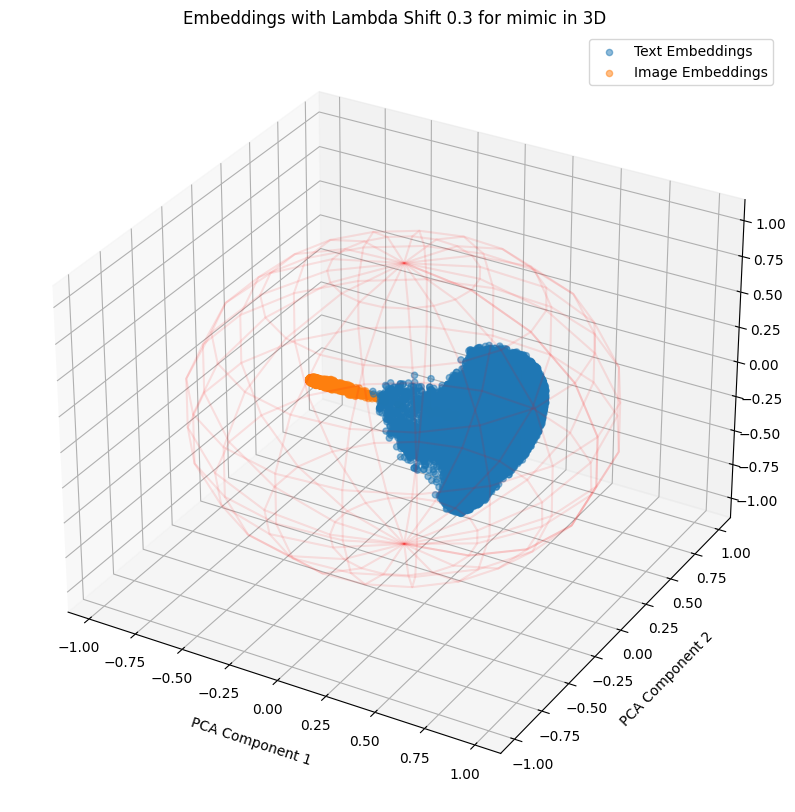

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.86 seconds
Total Training Time per Epoch: 1093.20 seconds
Average Inference Time per Epoch: 3.70 seconds
Total Inference Time per Epoch: 184.79 seconds


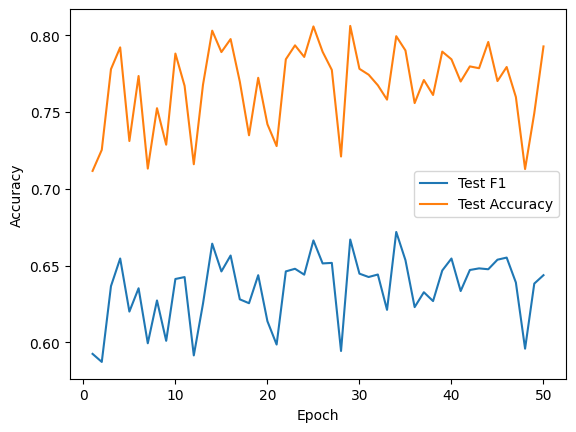

Best Accuracy: {'Acc': 0.806060606060606, 'F1': 0.6669960019642805, 'Auc': 0.8468239786772958, 'Epoch': 29, 'Auc_Per_Class': array([0.92924118, 0.82417772, 0.80112753, 0.83274948])}
Best Macro-F1: {'Acc': 0.7993741765480896, 'F1': 0.6719249467464257, 'Auc': 0.8525023185510366, 'Epoch': 34, 'Auc_Per_Class': array([0.93323109, 0.82356871, 0.82381225, 0.82939723])}
Best Macro-AUC: {'Acc': 0.7900856389986824, 'F1': 0.6535686171704451, 'Auc': 0.8581948597842137, 'Epoch': 35, 'Auc_Per_Class': array([0.93352616, 0.86605818, 0.81209912, 0.82109598])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.38 seconds
Total Training Time per Epoch: 919.02 seconds
Average Inference Time per Epoch: 3.62 seconds
Total Inference Time per Epoch: 180.90 seconds


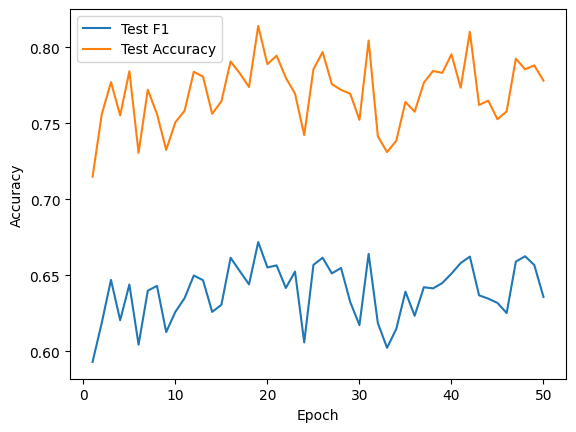

Best Accuracy: {'Acc': 0.8139986824769433, 'F1': 0.6718157071725985, 'Auc': 0.8481874174697726, 'Epoch': 19, 'Auc_Per_Class': array([0.93499284, 0.82859751, 0.79179125, 0.83736808])}
Best Macro-F1: {'Acc': 0.8139986824769433, 'F1': 0.6718157071725985, 'Auc': 0.8481874174697726, 'Epoch': 19, 'Auc_Per_Class': array([0.93499284, 0.82859751, 0.79179125, 0.83736808])}
Best Macro-AUC: {'Acc': 0.7648221343873518, 'F1': 0.6345968538768163, 'Auc': 0.8584309778798396, 'Epoch': 44, 'Auc_Per_Class': array([0.9306658 , 0.86399514, 0.83572733, 0.80333564])}
##################################################  Shift 0.4  ##################################################


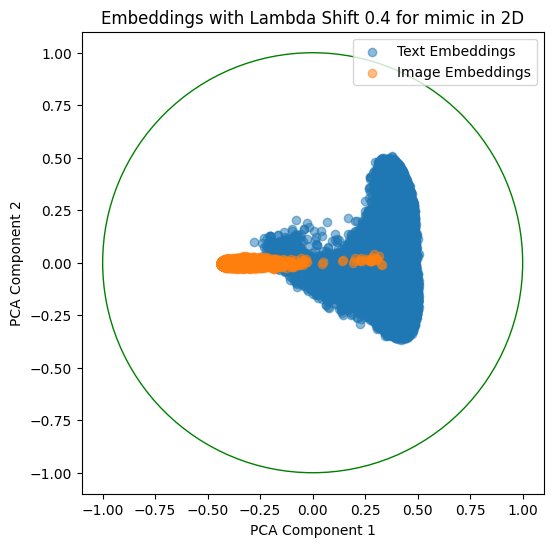

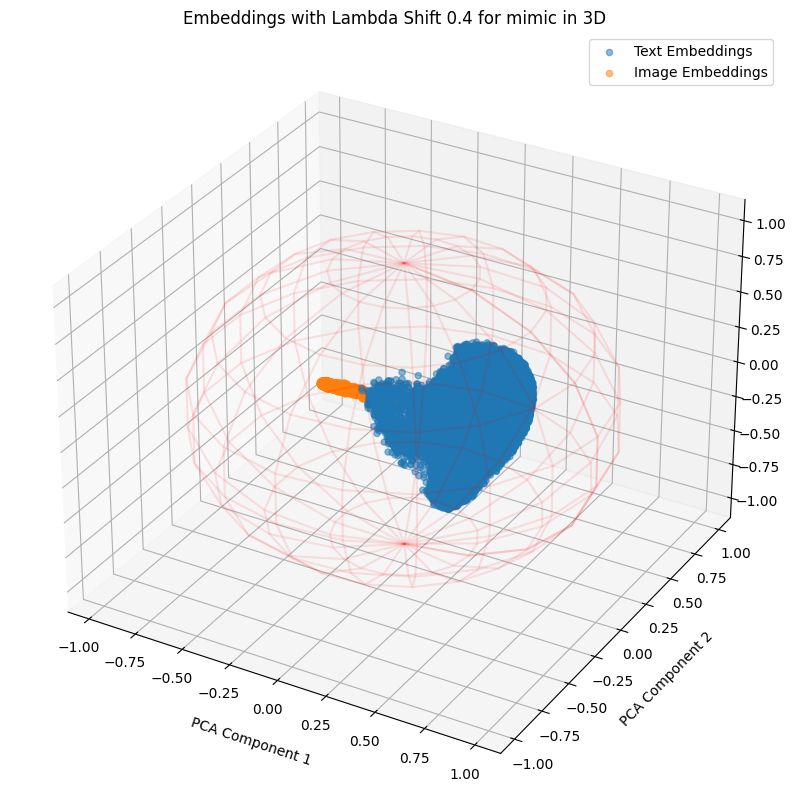

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 25.47 seconds
Total Training Time per Epoch: 1273.47 seconds
Average Inference Time per Epoch: 4.01 seconds
Total Inference Time per Epoch: 200.50 seconds


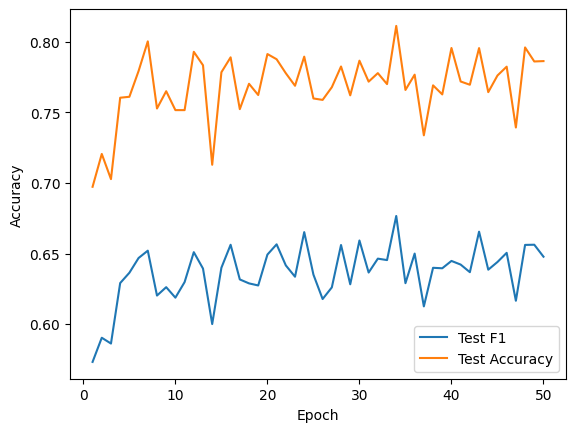

Best Accuracy: {'Acc': 0.8113636363636364, 'F1': 0.676659339166291, 'Auc': 0.8507891425828864, 'Epoch': 34, 'Auc_Per_Class': array([0.93443339, 0.8328305 , 0.80112411, 0.83476857])}
Best Macro-F1: {'Acc': 0.8113636363636364, 'F1': 0.676659339166291, 'Auc': 0.8507891425828864, 'Epoch': 34, 'Auc_Per_Class': array([0.93443339, 0.8328305 , 0.80112411, 0.83476857])}
Best Macro-AUC: {'Acc': 0.7867259552042161, 'F1': 0.6592701972905514, 'Auc': 0.8593781594094319, 'Epoch': 30, 'Auc_Per_Class': array([0.93301278, 0.85544325, 0.82890573, 0.82015087])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 54.02 seconds
Total Training Time per Epoch: 2700.79 seconds
Average Inference Time per Epoch: 12.17 seconds
Total Inference Time per Epoch: 608.58 seconds


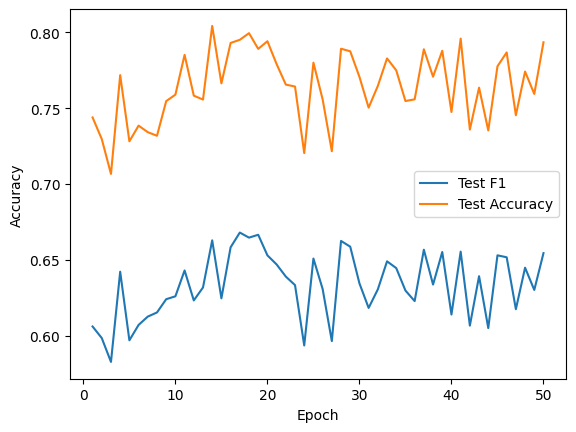

Best Accuracy: {'Acc': 0.8042490118577075, 'F1': 0.6629642394754546, 'Auc': 0.851016006762777, 'Epoch': 14, 'Auc_Per_Class': array([0.9319163 , 0.84087729, 0.80071157, 0.83055886])}
Best Macro-F1: {'Acc': 0.7950922266139657, 'F1': 0.6680713030464702, 'Auc': 0.8467494583936306, 'Epoch': 17, 'Auc_Per_Class': array([0.93254998, 0.81008007, 0.81802681, 0.82634097])}
Best Macro-AUC: {'Acc': 0.7994729907773386, 'F1': 0.6647227070032167, 'Auc': 0.8582058624350769, 'Epoch': 18, 'Auc_Per_Class': array([0.93450426, 0.85329118, 0.81677158, 0.82825643])}
##################################################  Shift 0.5  ##################################################


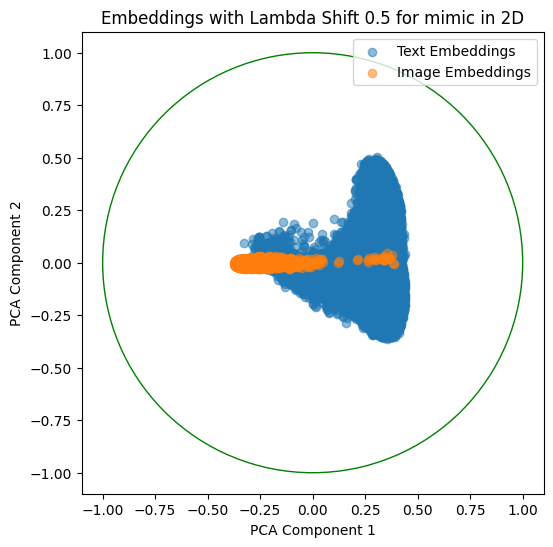

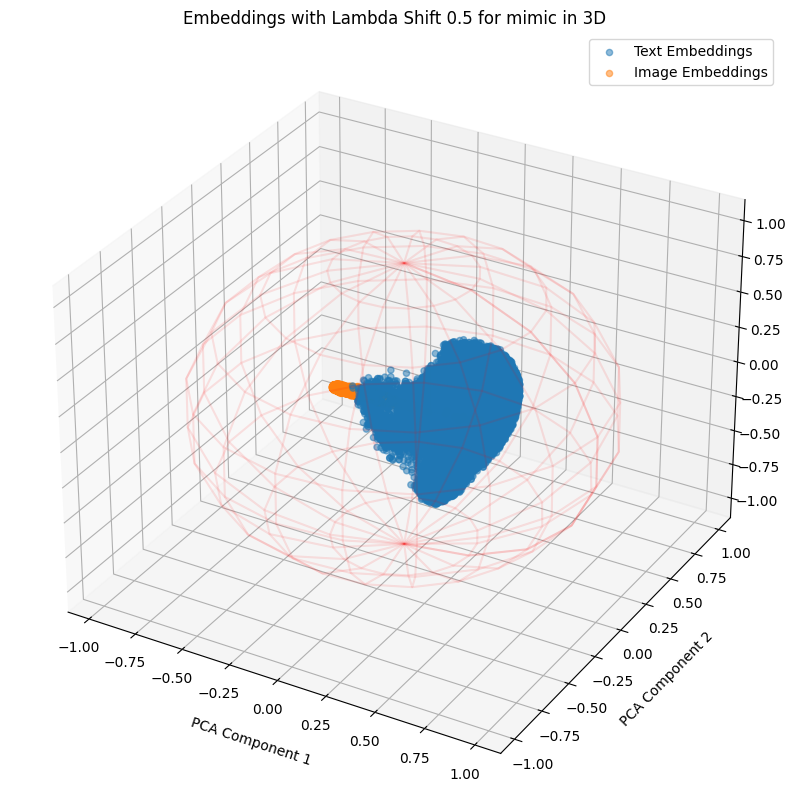

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.74 seconds
Total Training Time per Epoch: 1137.02 seconds
Average Inference Time per Epoch: 3.50 seconds
Total Inference Time per Epoch: 175.09 seconds


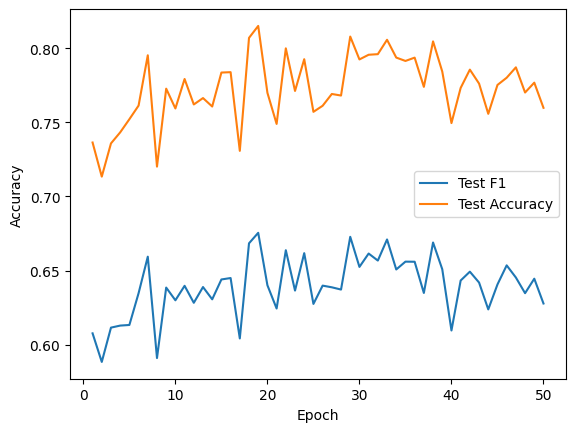

Best Accuracy: {'Acc': 0.8151515151515152, 'F1': 0.6754619376615336, 'Auc': 0.8505190964062496, 'Epoch': 19, 'Auc_Per_Class': array([0.93473627, 0.83756145, 0.79099832, 0.83878035])}
Best Macro-F1: {'Acc': 0.8151515151515152, 'F1': 0.6754619376615336, 'Auc': 0.8505190964062496, 'Epoch': 19, 'Auc_Per_Class': array([0.93473627, 0.83756145, 0.79099832, 0.83878035])}
Best Macro-AUC: {'Acc': 0.7762187088274045, 'F1': 0.6418851587820442, 'Auc': 0.8587571920360453, 'Epoch': 43, 'Auc_Per_Class': array([0.93401356, 0.8629639 , 0.82310528, 0.81494603])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 21.91 seconds
Total Training Time per Epoch: 1095.72 seconds
Average Inference Time per Epoch: 4.62 seconds
Total Inference Time per Epoch: 230.99 seconds


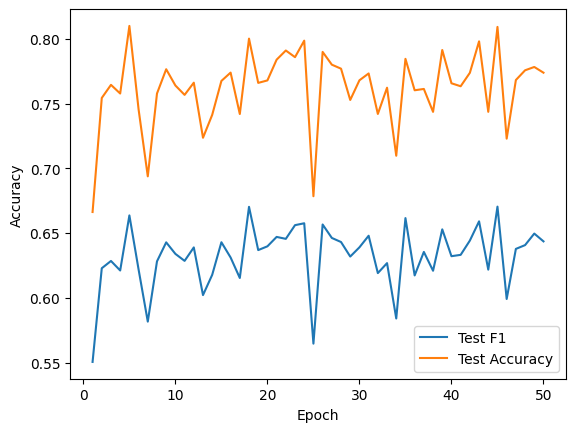

Best Accuracy: {'Acc': 0.8099143610013175, 'F1': 0.6636469755851444, 'Auc': 0.8460761585167975, 'Epoch': 5, 'Auc_Per_Class': array([0.92046592, 0.84688207, 0.78494258, 0.83201406])}
Best Macro-F1: {'Acc': 0.8091567852437418, 'F1': 0.6704264264529156, 'Auc': 0.8461847996337345, 'Epoch': 45, 'Auc_Per_Class': array([0.93239757, 0.81557818, 0.80070733, 0.83605611])}
Best Macro-AUC: {'Acc': 0.7674571805006588, 'F1': 0.6429387647662209, 'Auc': 0.8591658393016715, 'Epoch': 15, 'Auc_Per_Class': array([0.93379527, 0.85571448, 0.83884932, 0.8083043 ])}
##################################################  Shift 0.6  ##################################################


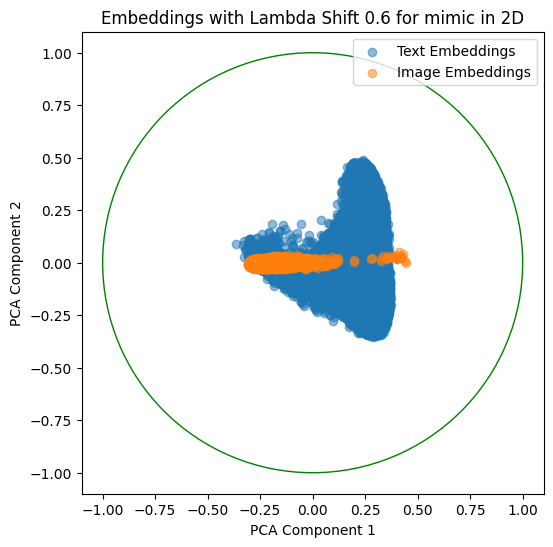

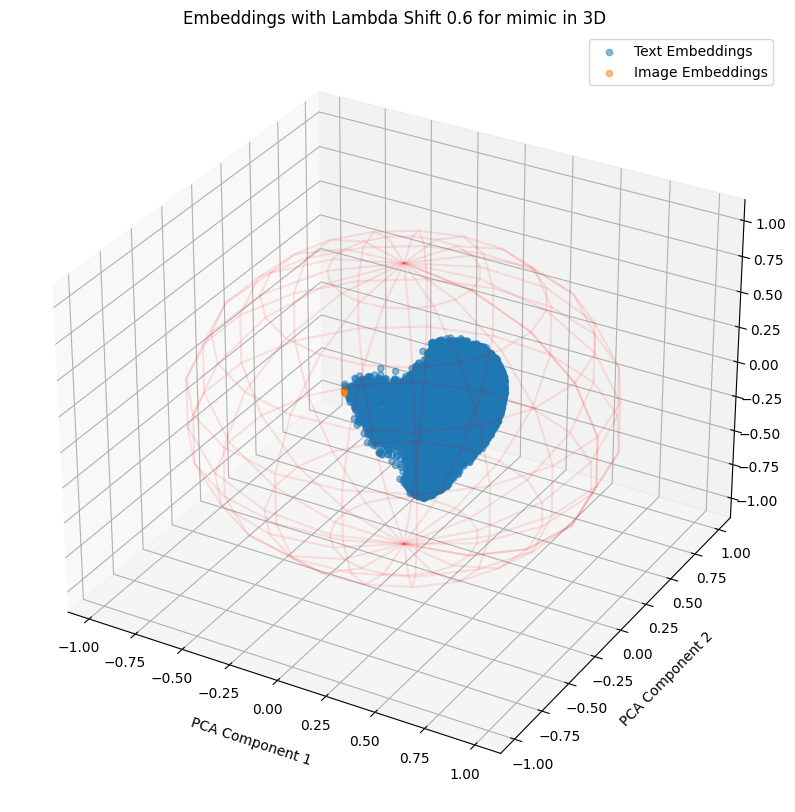

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 41.57 seconds
Total Training Time per Epoch: 2078.55 seconds
Average Inference Time per Epoch: 6.90 seconds
Total Inference Time per Epoch: 345.14 seconds


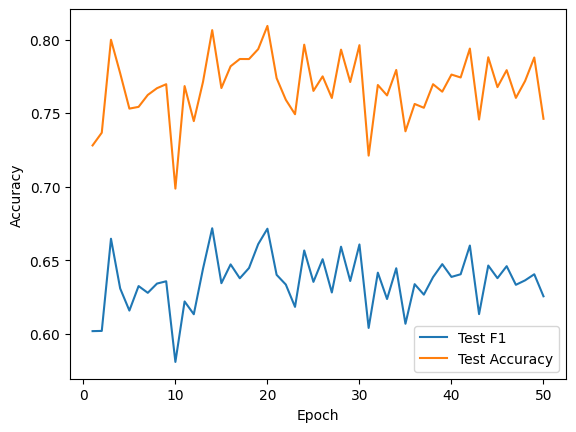

Best Accuracy: {'Acc': 0.8092226613965744, 'F1': 0.6714953912447347, 'Auc': 0.846940693729958, 'Epoch': 20, 'Auc_Per_Class': array([0.92824938, 0.81933571, 0.80934187, 0.83083582])}
Best Macro-F1: {'Acc': 0.8063570487483531, 'F1': 0.6718093877492405, 'Auc': 0.8560629526798093, 'Epoch': 14, 'Auc_Per_Class': array([0.93198765, 0.84604276, 0.81505195, 0.83116944])}
Best Macro-AUC: {'Acc': 0.7742094861660079, 'F1': 0.6405625376712178, 'Auc': 0.8567666818635608, 'Epoch': 41, 'Auc_Per_Class': array([0.93283748, 0.85219183, 0.82926199, 0.81277543])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 43.33 seconds
Total Training Time per Epoch: 2166.70 seconds
Average Inference Time per Epoch: 7.37 seconds
Total Inference Time per Epoch: 368.41 seconds


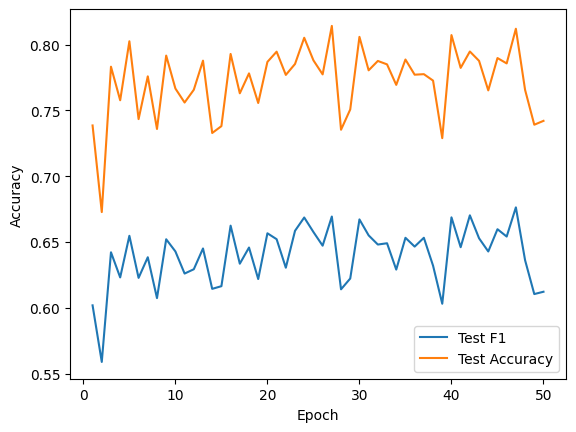

Best Accuracy: {'Acc': 0.8141963109354414, 'F1': 0.6693710842441158, 'Auc': 0.8442150073496307, 'Epoch': 27, 'Auc_Per_Class': array([0.93228842, 0.8192922 , 0.78808529, 0.83719412])}
Best Macro-F1: {'Acc': 0.8120553359683794, 'F1': 0.6763266592052647, 'Auc': 0.8486384890176776, 'Epoch': 47, 'Auc_Per_Class': array([0.93189669, 0.82073392, 0.80597715, 0.83594619])}
Best Macro-AUC: {'Acc': 0.778129117259552, 'F1': 0.6458149674941297, 'Auc': 0.8615196811029124, 'Epoch': 18, 'Auc_Per_Class': array([0.93530517, 0.86932593, 0.8263625 , 0.81508514])}
##################################################  Shift 0.7  ##################################################


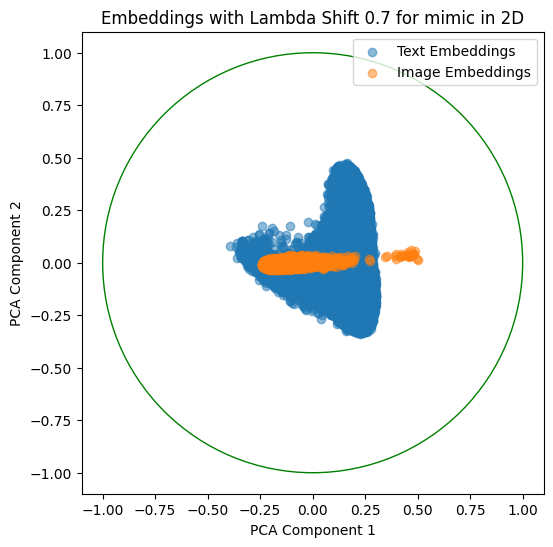

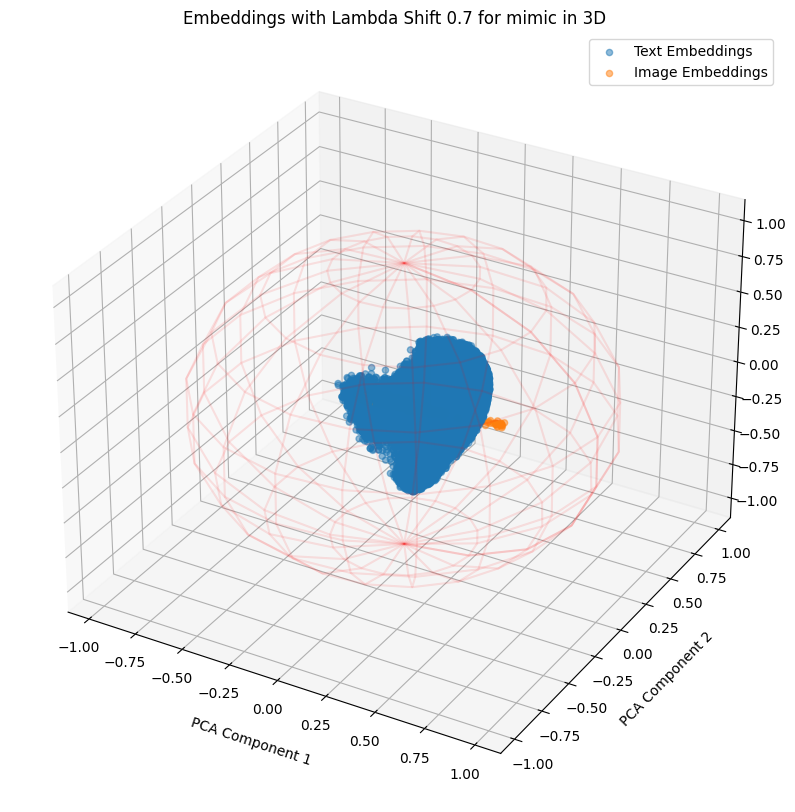

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 48.71 seconds
Total Training Time per Epoch: 2435.56 seconds
Average Inference Time per Epoch: 8.57 seconds
Total Inference Time per Epoch: 428.53 seconds


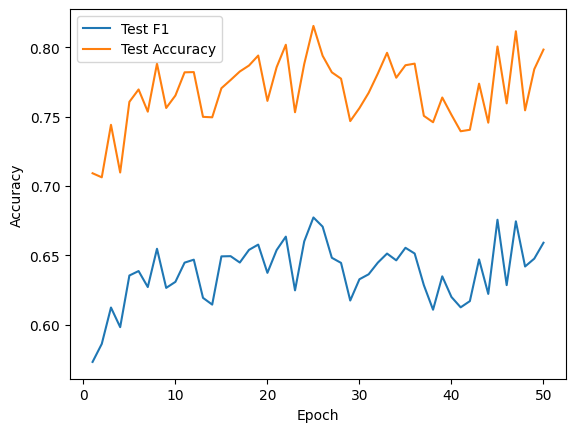

Best Accuracy: {'Acc': 0.8153162055335968, 'F1': 0.6773056751160995, 'Auc': 0.8423778512917808, 'Epoch': 25, 'Auc_Per_Class': array([0.9319019 , 0.80423445, 0.79493102, 0.83844403])}
Best Macro-F1: {'Acc': 0.8153162055335968, 'F1': 0.6773056751160995, 'Auc': 0.8423778512917808, 'Epoch': 25, 'Auc_Per_Class': array([0.9319019 , 0.80423445, 0.79493102, 0.83844403])}
Best Macro-AUC: {'Acc': 0.7841567852437418, 'F1': 0.6476414215969137, 'Auc': 0.8564959242080562, 'Epoch': 49, 'Auc_Per_Class': array([0.93491228, 0.85734757, 0.814436  , 0.81928784])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.16 seconds
Total Training Time per Epoch: 907.79 seconds
Average Inference Time per Epoch: 3.53 seconds
Total Inference Time per Epoch: 176.53 seconds


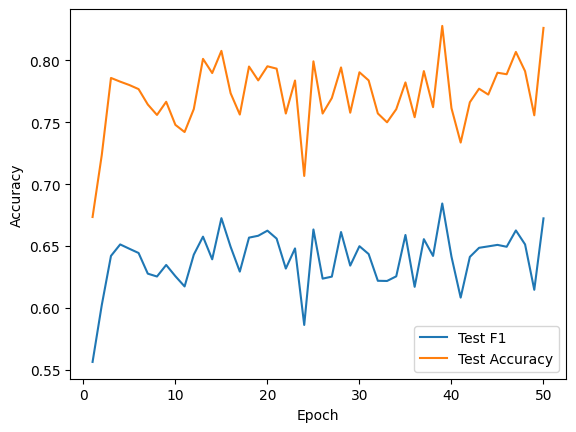

Best Accuracy: {'Acc': 0.827832674571805, 'F1': 0.6843858525609914, 'Auc': 0.8424345154074476, 'Epoch': 39, 'Auc_Per_Class': array([0.93143552, 0.81332735, 0.78211992, 0.84285527])}
Best Macro-F1: {'Acc': 0.827832674571805, 'F1': 0.6843858525609914, 'Auc': 0.8424345154074476, 'Epoch': 39, 'Auc_Per_Class': array([0.93143552, 0.81332735, 0.78211992, 0.84285527])}
Best Macro-AUC: {'Acc': 0.7558959156785243, 'F1': 0.6253760758926293, 'Auc': 0.8590858226368437, 'Epoch': 8, 'Auc_Per_Class': array([0.93156287, 0.87613008, 0.82808196, 0.80056838])}
##################################################  Shift 0.8  ##################################################


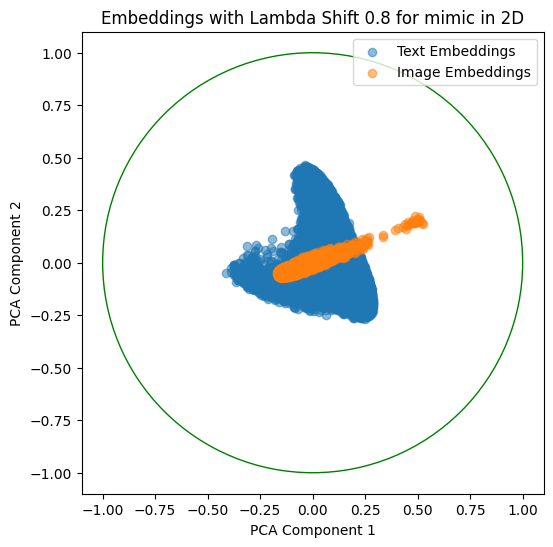

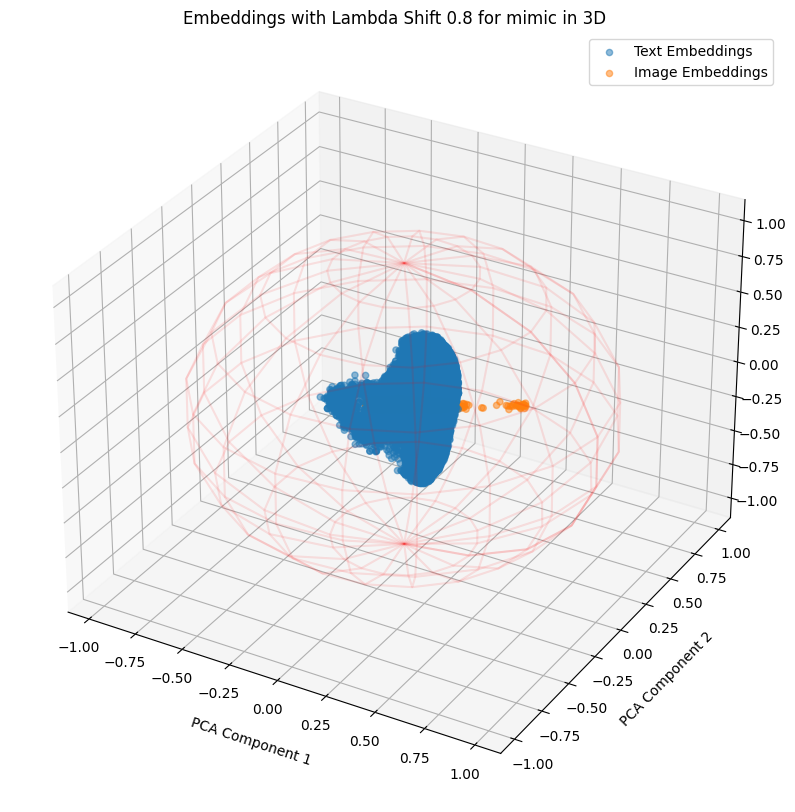

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 22.17 seconds
Total Training Time per Epoch: 1108.43 seconds
Average Inference Time per Epoch: 3.47 seconds
Total Inference Time per Epoch: 173.51 seconds


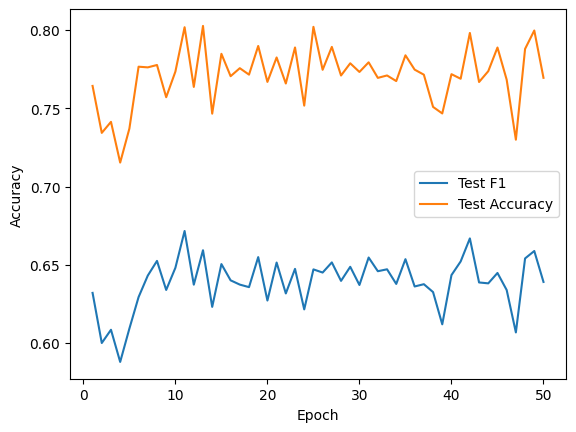

Best Accuracy: {'Acc': 0.8026350461133069, 'F1': 0.6593086551342309, 'Auc': 0.8478902360625649, 'Epoch': 13, 'Auc_Per_Class': array([0.93329226, 0.83619444, 0.79430806, 0.82776618])}
Best Macro-F1: {'Acc': 0.8018115942028986, 'F1': 0.671607174907786, 'Auc': 0.8491556948133488, 'Epoch': 11, 'Auc_Per_Class': array([0.93005037, 0.82722133, 0.81094046, 0.82841063])}
Best Macro-AUC: {'Acc': 0.7838603425559947, 'F1': 0.6535857630642046, 'Auc': 0.8594921415221471, 'Epoch': 35, 'Auc_Per_Class': array([0.93493969, 0.85808968, 0.82566841, 0.81927078])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 18.86 seconds
Total Training Time per Epoch: 943.06 seconds
Average Inference Time per Epoch: 3.52 seconds
Total Inference Time per Epoch: 175.92 seconds


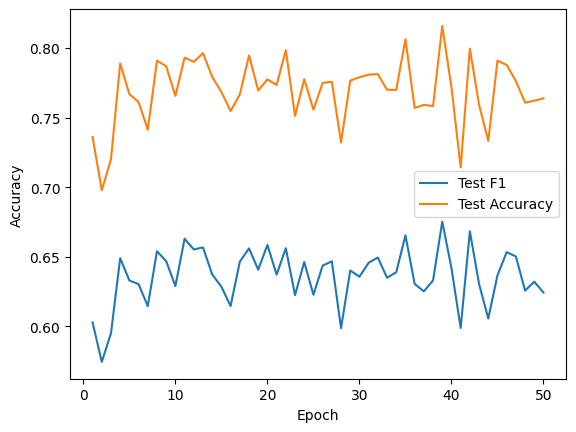

Best Accuracy: {'Acc': 0.8157773386034256, 'F1': 0.6752424257887032, 'Auc': 0.8507660232660575, 'Epoch': 39, 'Auc_Per_Class': array([0.93567632, 0.83260479, 0.79635214, 0.83843083])}
Best Macro-F1: {'Acc': 0.8157773386034256, 'F1': 0.6752424257887032, 'Auc': 0.8507660232660575, 'Epoch': 39, 'Auc_Per_Class': array([0.93567632, 0.83260479, 0.79635214, 0.83843083])}
Best Macro-AUC: {'Acc': 0.758201581027668, 'F1': 0.6330181609055451, 'Auc': 0.8575271135875762, 'Epoch': 38, 'Auc_Per_Class': array([0.93235576, 0.86295317, 0.83449967, 0.80029986])}
##################################################  Shift 0.9  ##################################################


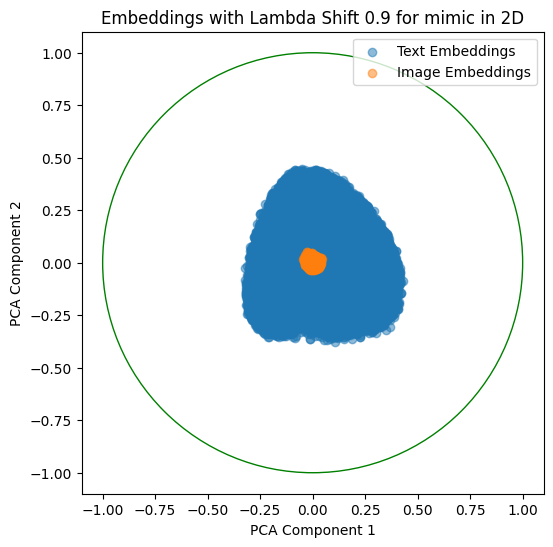

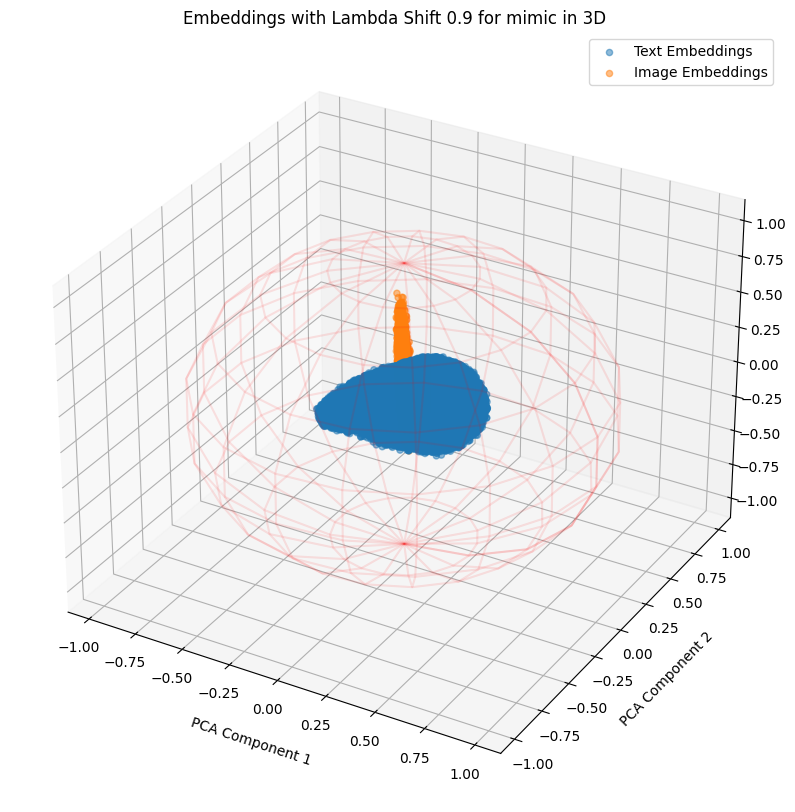

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 20.55 seconds
Total Training Time per Epoch: 1027.31 seconds
Average Inference Time per Epoch: 3.52 seconds
Total Inference Time per Epoch: 175.83 seconds


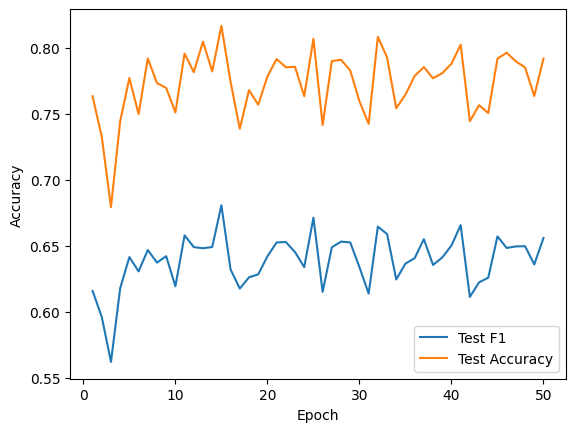

Best Accuracy: {'Acc': 0.816501976284585, 'F1': 0.6807058039073814, 'Auc': 0.8475074207158116, 'Epoch': 15, 'Auc_Per_Class': array([0.93435756, 0.82645416, 0.78957736, 0.8396406 ])}
Best Macro-F1: {'Acc': 0.816501976284585, 'F1': 0.6807058039073814, 'Auc': 0.8475074207158116, 'Epoch': 15, 'Auc_Per_Class': array([0.93435756, 0.82645416, 0.78957736, 0.8396406 ])}
Best Macro-AUC: {'Acc': 0.7644598155467721, 'F1': 0.636551157951688, 'Auc': 0.8593702082194532, 'Epoch': 35, 'Auc_Per_Class': array([0.92981551, 0.87532713, 0.82934355, 0.80299465])}
Training Late Fusion Model:
The number of parameters of the model are: 312196
Average Training Time per Epoch: 17.77 seconds
Total Training Time per Epoch: 888.27 seconds
Average Inference Time per Epoch: 3.51 seconds
Total Inference Time per Epoch: 175.67 seconds


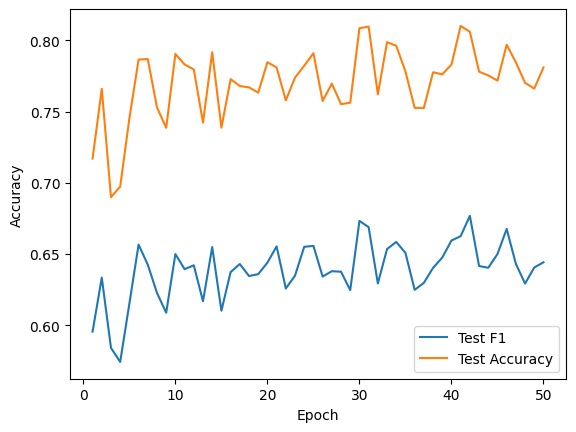

Best Accuracy: {'Acc': 0.8100790513833992, 'F1': 0.6625313787875993, 'Auc': 0.8477401550034884, 'Epoch': 41, 'Auc_Per_Class': array([0.93399253, 0.83784342, 0.78281253, 0.83631215])}
Best Macro-F1: {'Acc': 0.8059617918313571, 'F1': 0.6767810227772086, 'Auc': 0.8424440393007225, 'Epoch': 42, 'Auc_Per_Class': array([0.93376906, 0.79734786, 0.8059367 , 0.83272254])}
Best Macro-AUC: {'Acc': 0.7779644268774704, 'F1': 0.6415967197249921, 'Auc': 0.8597607565930421, 'Epoch': 43, 'Auc_Per_Class': array([0.93297002, 0.87596992, 0.813025  , 0.81707809])}
##################################################  Shift 1  ##################################################


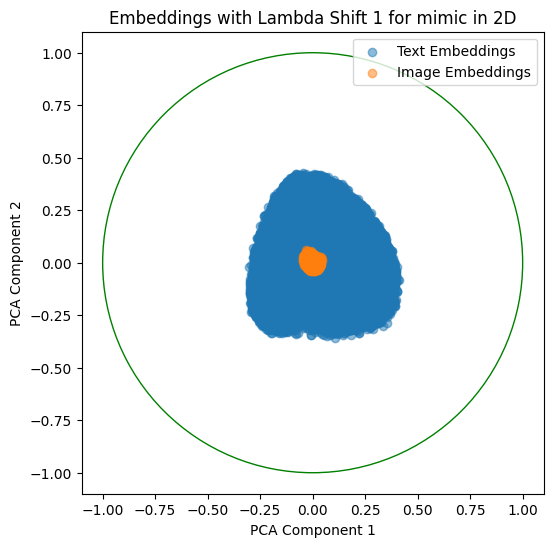

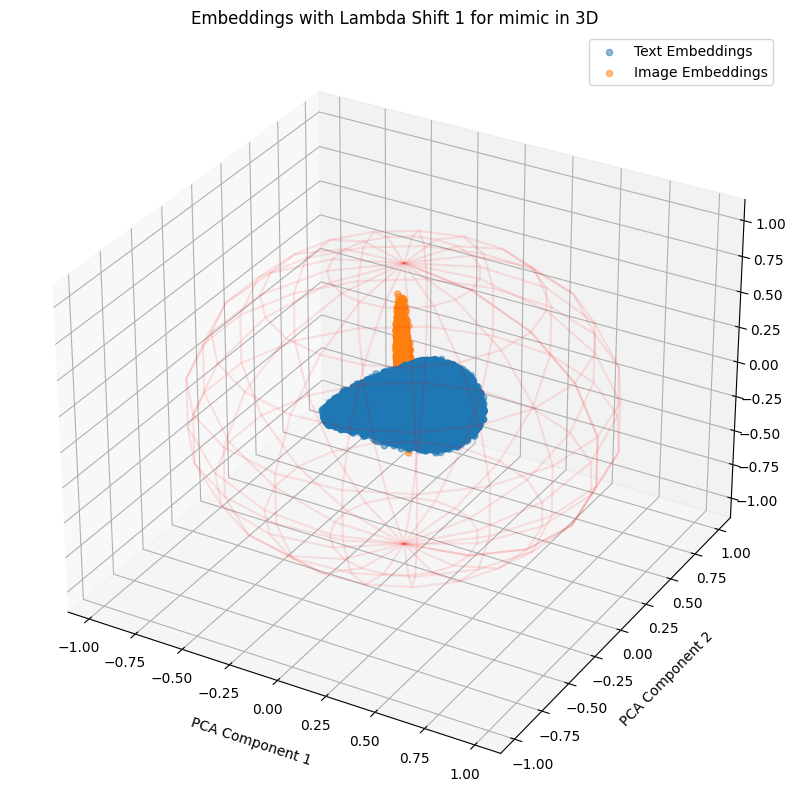

Train Shape: (107695, 8201)
Test Shape: (30360, 8201)
Training Early Fusion Model:
The number of parameters of the model are: 623492
Average Training Time per Epoch: 21.33 seconds
Total Training Time per Epoch: 1066.73 seconds
Average Inference Time per Epoch: 3.41 seconds
Total Inference Time per Epoch: 170.68 seconds


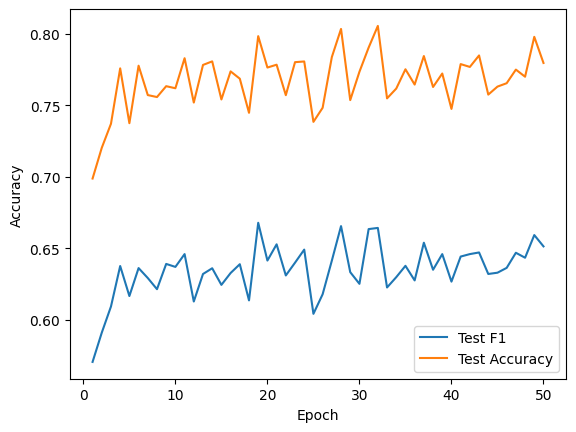

Best Accuracy: {'Acc': 0.8056324110671936, 'F1': 0.6642938274084205, 'Auc': 0.8505156272182477, 'Epoch': 32, 'Auc_Per_Class': array([0.92835451, 0.83960345, 0.80296608, 0.83113846])}
Best Macro-F1: {'Acc': 0.7984848484848485, 'F1': 0.6679050177829278, 'Auc': 0.8512176191054703, 'Epoch': 19, 'Auc_Per_Class': array([0.93018171, 0.82317053, 0.82615272, 0.82536551])}
Best Macro-AUC: {'Acc': 0.7541831357048748, 'F1': 0.6244439694187593, 'Auc': 0.8574433754581203, 'Epoch': 15, 'Auc_Per_Class': array([0.92948618, 0.87033155, 0.83067772, 0.79927806])}
Training Late Fusion Model:
The number of parameters of the model are: 312196


In [ ]:
# Assuming df is your DataFrame
lambda_shift_values = [-1, -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]  # Negative values bring embeddings closer, positive values push them apart
#lambda_shift_values = [-1, -0.8, -0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1]  # Negative values bring embeddings closer, positive values push them apart

# Normalize initial embeddings
df[text_columns] = normalize_embeddings(df[text_columns].values)
df[image_columns] = normalize_embeddings(df[image_columns].values)

# Dataframe with shifted values:
df_shifted = df.copy()

results = {}

for lambda_shift in lambda_shift_values:
    
    print('#'*50, f' Shift {lambda_shift} ', '#'*50)
    
    # Extract embeddings
    text_embeddings = df[text_columns].values
    image_embeddings = df[image_columns].values
    
    # Modify and normalize embeddings
    text_embeddings_shifted, image_embeddings_shifted = modify_and_normalize_embeddings(text_embeddings, image_embeddings, lambda_shift)
    
    # Update column names based on the new dimensions
    if text_embeddings.shape[1] < text_embeddings_shifted.shape[1]:
        text_columns_updated = update_column_names(text_columns, text_embeddings_shifted.shape[1])
    else: 
        text_columns_updated = text_columns
        
    if image_embeddings.shape[1] < image_embeddings_shifted.shape[1]: 
        image_columns_updated = update_column_names(image_columns, image_embeddings_shifted.shape[1])
    else:
        image_columns_updated = image_columns
    
    # Update DataFrame with shifted embeddings
    df_shifted[text_columns_updated] = text_embeddings_shifted
    df_shifted[image_columns_updated] = image_embeddings_shifted
    
    # Visualize shifted embeddings
    visualize_embeddings(text_embeddings_shifted, image_embeddings_shifted, f'Embeddings with Lambda Shift {lambda_shift} for {DATASET}', lambda_shift, DATASET)
    
    # Split the data
    train_df, test_df = split_data(df_shifted)
    
    
    # Process and one-hot encode labels for training set
    train_labels, mlb, train_columns = process_labels(train_df, col=label_columns)
    test_labels = process_labels(test_df, col=label_columns, train_columns=train_columns)

    train_dataset = VQADataset(train_df, text_columns, image_columns, label_columns, mlb, train_columns)
    test_dataset = VQADataset(test_df, text_columns, image_columns, label_columns, mlb, train_columns)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    text_input_size = len(text_columns)
    image_input_size = len(image_columns)

    ### Models:
    # Train early fusion model
    print("Training Early Fusion Model:")
    accuracy, precision, recall, f1, best = train_early_fusion(train_loader, test_loader, text_input_size, image_input_size, output_size, num_epochs=num_epochs, multilabel=multilabel, report=True, V=False)
    print(f"Best Accuracy: {best['Acc']}")
    print(f"Best Macro-F1: {best['Macro-F1']}")
    print(f"Best Macro-AUC: {best['AUC']}")
    
    results[f"early_({lambda_shift})"] = best
    
    # Train late fusion model
    print("Training Late Fusion Model:")
    accuracy, precision, recall, f1, best = train_late_fusion(train_loader, test_loader, text_input_size, image_input_size, output_size, num_epochs=num_epochs, multilabel=multilabel, report=True, V=False)
    print(f"Best Accuracy: {best['Acc']}")
    print(f"Best Macro-F1: {best['Macro-F1']}")
    print(f"Best Macro-AUC: {best['AUC']}")
    
    results[f"late_({lambda_shift})"] = best

In [ ]:
print('Results Early Fusion: ')
for lambda_shift in lambda_shift_values:
    print(f'Shift = {lambda_shift}')
    print(f"Best Accuracy: {results[f'early_({lambda_shift})']['Acc']}")
    print(f"Best F1: {results[f'early_({lambda_shift})']['Macro-F1']}")
    print(f"Best AUC: {results[f'early_({lambda_shift})']['AUC']}")
    
print('Results Late Fusion: ')
for lambda_shift in lambda_shift_values:
    print(f'Shift = {lambda_shift}')
    print(f"Best Accuracy: {results[f'late_({lambda_shift})']['Acc']}")
    print(f"Best F1: {results[f'late_({lambda_shift})']['Macro-F1']}")
    print(f"Best AUC: {results[f'early_({lambda_shift})']['AUC']}")

In [ ]:
plot_results(results, lambda_shift_values, DATASET)